<h1>Preparation</h1>

In [1]:
import numpy as np
import scipy.io as sio
from scipy.sparse import lil_matrix
import scipy.sparse as sp
import matplotlib.pyplot as plt
from sklearn.preprocessing import normalize
import json
import csv

import time
from time import perf_counter
import sklearn.metrics as skmet

In [2]:
from SEER.seer import seer
import SEER.nntools as nnt

In [3]:
with open("./config.json") as c:
            config = json.load(c)
            #garden_points_db_path = config["garden_points_db"]
            #garden_points_matrix_path = config["garden_points_matrix"]
            #garden_query_points_path = config["garden_query_points"]
            #raw_data_db = config["raw_garden_points_db"]
            #raw_data_query = config["raw_garden_query_points"]
            
            
            garden_gt_data = config["garden_ground_truth"]
            garden_db_1_path = config["garden_points_db_bz"]
            garden_q_1_path = config["garden_query_points_bz"]
            
            garden_db_2_path = config["garden_points_db_pn"]
            garden_q_2_path = config["garden_query_points_pn"]
            
            nl_spring_path = config["nl_spring_seer"]
            nl_winter_path = config["nl_winter_seer"]
            

In [4]:
with open(garden_db_2_path, newline='') as csvfile:
    garden_DB_SEER_2 = np.array(list(csv.reader(csvfile)), dtype='float')
    
with open(garden_q_2_path, newline='') as csvfile:
    garden_Q_SEER_2 = np.array(list(csv.reader(csvfile)), dtype='float')

    
DS_garden_1 = sp.load_npz(garden_db_1_path)
Q_garden_1 = sp.load_npz(garden_q_1_path)

DS_garden_2 = lil_matrix(garden_DB_SEER_2)
Q_garden_2 = lil_matrix(garden_Q_SEER_2)

nl_spring_seer = sio.loadmat(nl_spring_path)['DB_SEER_run2']
nl_winter_seer = sio.loadmat(nl_winter_path)['Q_SEER']


<h1>Distances and Similarities</h1>

<h2>Cosine Similarity (builtin)</h2>

<h3>Garden Points BZ</h3>

Duration Cosine Sim: 0.008099124999716878 seconds
Median Distance to GT-NN: 1.0
Average Distance to GT-NN: 5.61
Median Rank of GT-NN: 2.0
Average Rank of GT-NN: 10.03
129 out of 200 within top 5 NNs


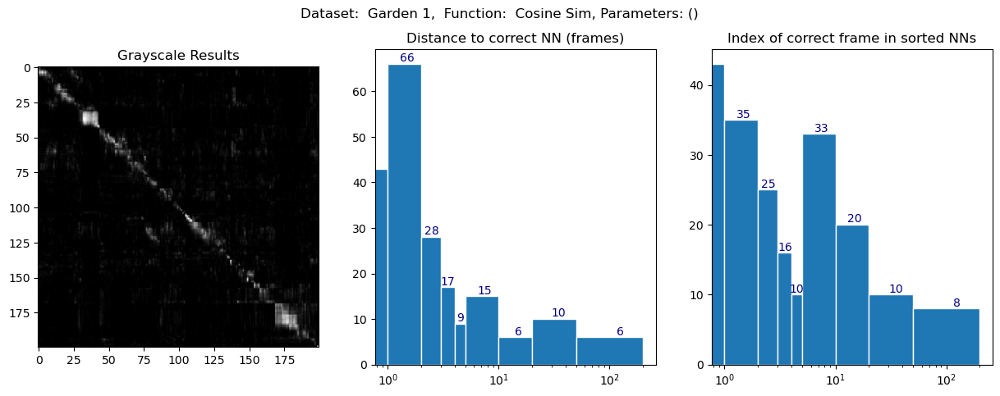

In [8]:
r, rdh, rr = nnt.run_and_evaluate_func_on_data(skmet.pairwise.cosine_similarity, DS_garden_1, Q_garden_1, "Garden 1", "Cosine Sim", True)

<h3>Garden Points PN</h3>

Duration Cosine Sim: 0.006082250038161874 seconds
Median Distance to GT-NN: 1.0
Average Distance to GT-NN: 10.375
Median Rank of GT-NN: 2.0
Average Rank of GT-NN: 10.905
129 out of 200 within top 5 NNs


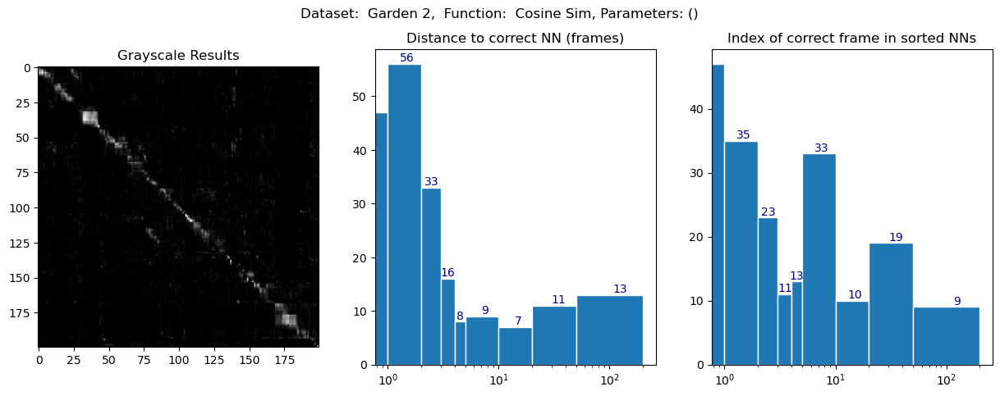

In [9]:
r, rdh, rr = nnt.run_and_evaluate_func_on_data(skmet.pairwise.cosine_similarity, DS_garden_2, Q_garden_2, "Garden 2", "Cosine Sim", True)

<h3>Nordland Spring and Winter</h3>

Duration Cosine Sim: 0.019400666002184153 seconds
Median Distance to GT-NN: 0.0
Average Distance to GT-NN: 9.176
Median Rank of GT-NN: 0.0
Average Rank of GT-NN: 4.731
978 out of 1000 within top 5 NNs


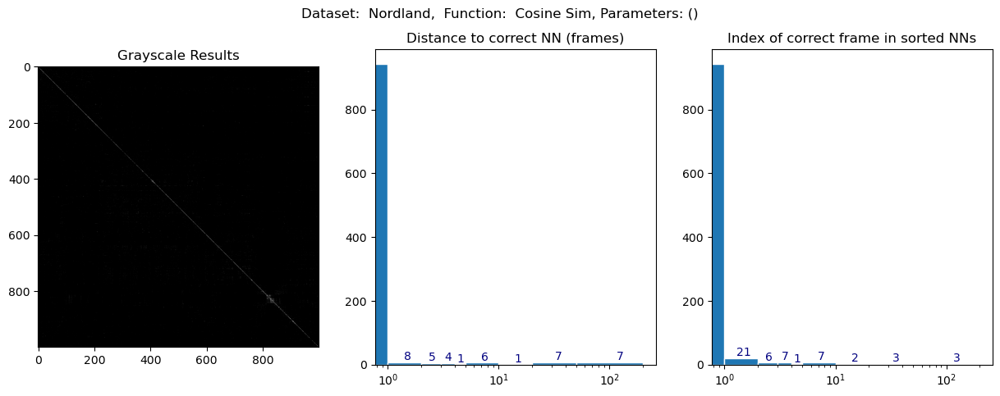

In [10]:
r, rdh, rr = nnt.run_and_evaluate_func_on_data(skmet.pairwise.cosine_similarity, nl_spring_seer, nl_winter_seer, "Nordland", "Cosine Sim", True)

<h2>Fractional Distances</h2>

<h3>k=0.1</h3>

<h4>Garden Points BZ</h4>

Duration Fractional_Dist: 2.6548240840202197 seconds
Median Distance to GT-NN: 81.5
Average Distance to GT-NN: 83.875
Median Rank of GT-NN: 6.0
Average Rank of GT-NN: 15.06
76 out of 200 within top 5 NNs


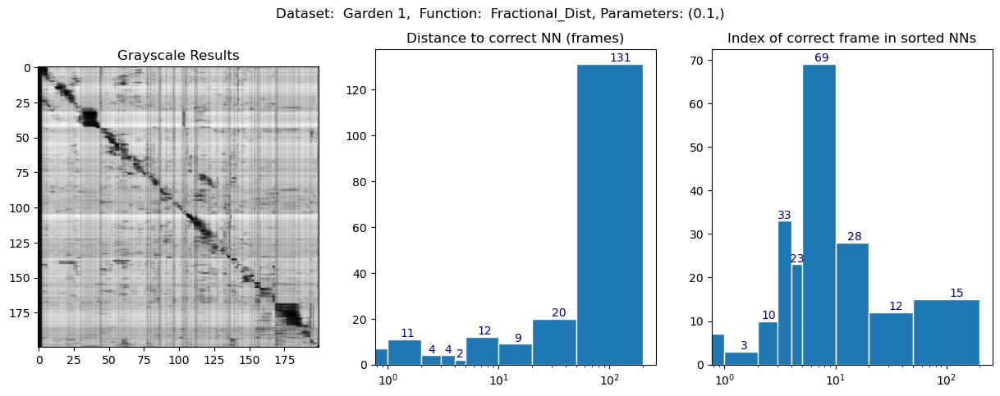

In [8]:
r, rdh, rr = nnt.run_and_evaluate_func_on_data(nnt.sequential_lk_dist, DS_garden_1, Q_garden_1, "Garden 1", "Fractional_Dist", False, 0.1)

<h4>Garden Points PN</h4>

Duration Fractional_Dist: 3.0565793750574812 seconds
Median Distance to GT-NN: 87.5
Average Distance to GT-NN: 88.455
Median Rank of GT-NN: 5.0
Average Rank of GT-NN: 17.43
97 out of 200 within top 5 NNs


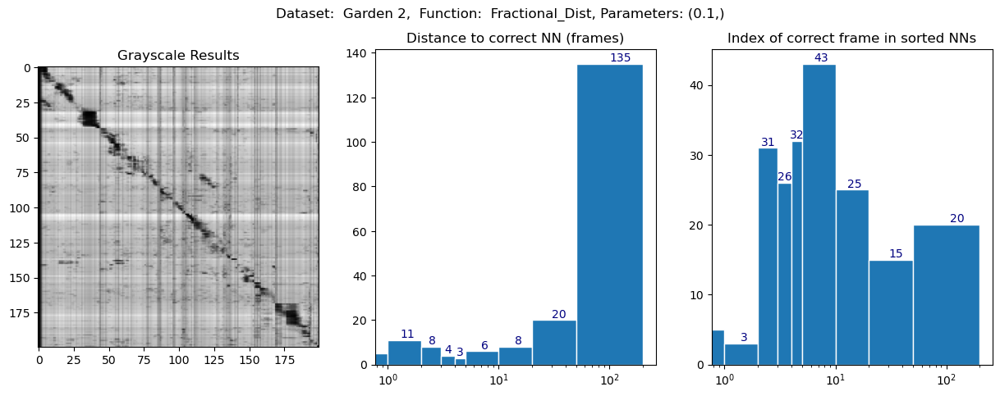

In [9]:
r, rdh, rr = nnt.run_and_evaluate_func_on_data(nnt.sequential_lk_dist, DS_garden_2, Q_garden_2, "Garden 2", "Fractional_Dist", False, 0.1)

<h4>Nordland</h4>

Duration Fractional_Dist: 1456.6983569170116 seconds
Median Distance to GT-NN: 0.0
Average Distance to GT-NN: 26.622
Median Rank of GT-NN: 0.0
Average Rank of GT-NN: 7.347
947 out of 1000 within top 5 NNs


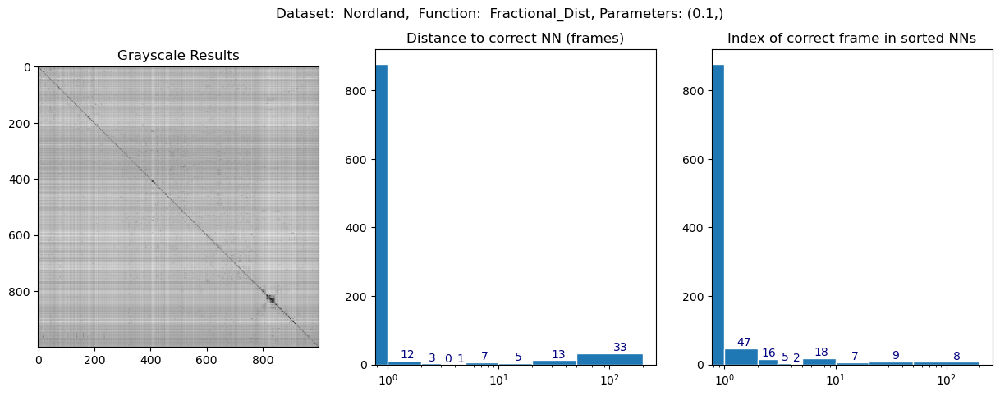

In [10]:
r, rdh, rr = nnt.run_and_evaluate_func_on_data(nnt.sequential_lk_dist, nl_spring_seer, nl_winter_seer, "Nordland", "Fractional_Dist", False, 0.1)

<h3>k=0.2</h3>

<h4>Garden Points BZ</h4>

Duration Fractional_Dist: 2.6547721249517053 seconds
Median Distance to GT-NN: 81.5
Average Distance to GT-NN: 83.655
Median Rank of GT-NN: 6.0
Average Rank of GT-NN: 17.48
75 out of 200 within top 5 NNs


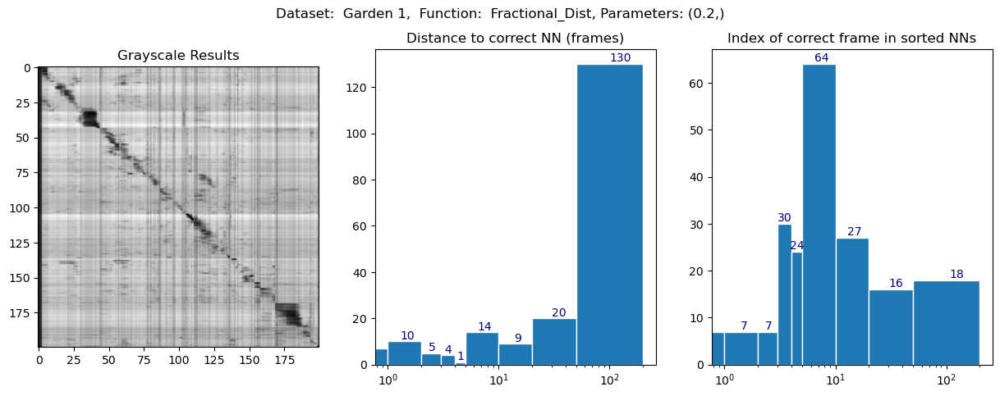

In [11]:
r, rdh, rr = nnt.run_and_evaluate_func_on_data(nnt.sequential_lk_dist, DS_garden_1, Q_garden_1, "Garden 1", "Fractional_Dist", False, 0.2)

<h4>Garden Points PN</h4>

Duration Fractional_Dist: 4.740783208981156 seconds
Median Distance to GT-NN: 88.5
Average Distance to GT-NN: 89.545
Median Rank of GT-NN: 5.0
Average Rank of GT-NN: 21.43
94 out of 200 within top 5 NNs


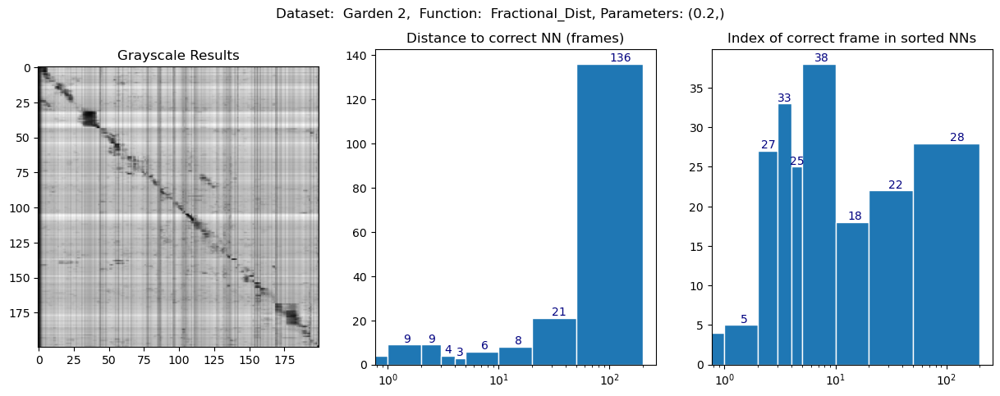

In [12]:
r, rdh, rr = nnt.run_and_evaluate_func_on_data(nnt.sequential_lk_dist, DS_garden_2, Q_garden_2, "Garden 2", "Fractional_Dist", False, 0.2)

<h4>Nordland</h4>

Duration Fractional_Dist: 1442.5784829580225 seconds
Median Distance to GT-NN: 0.0
Average Distance to GT-NN: 26.534
Median Rank of GT-NN: 0.0
Average Rank of GT-NN: 8.857
950 out of 1000 within top 5 NNs


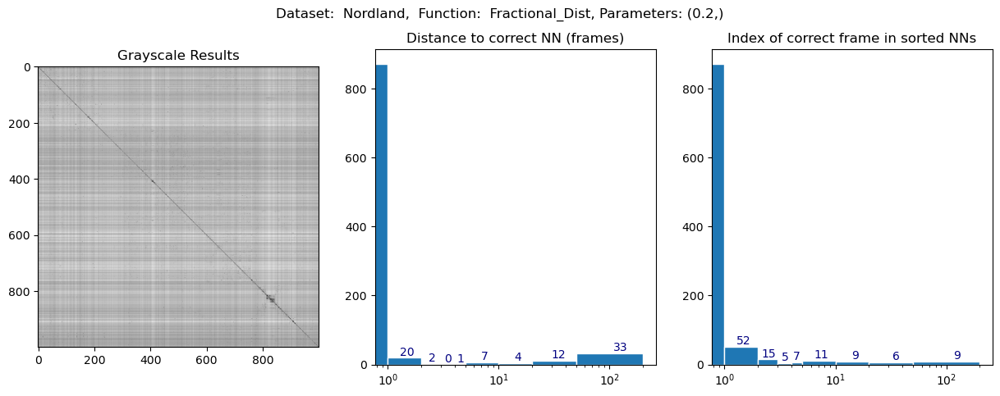

In [13]:
r, rdh, rr = nnt.run_and_evaluate_func_on_data(nnt.sequential_lk_dist, nl_spring_seer, nl_winter_seer, "Nordland", "Fractional_Dist", False, 0.2)

<h2>Only parts of Garden, Fractional</h2>

<h3>Garden BZ</h3>

Duration Fractional_Dist: 2.6121702500386164 seconds
Median Distance to GT-NN: 2.0
Average Distance to GT-NN: 9.350515463917526
Median Rank of GT-NN: 3.0
Average Rank of GT-NN: 12.541237113402062
115 out of 194 within top 5 NNs


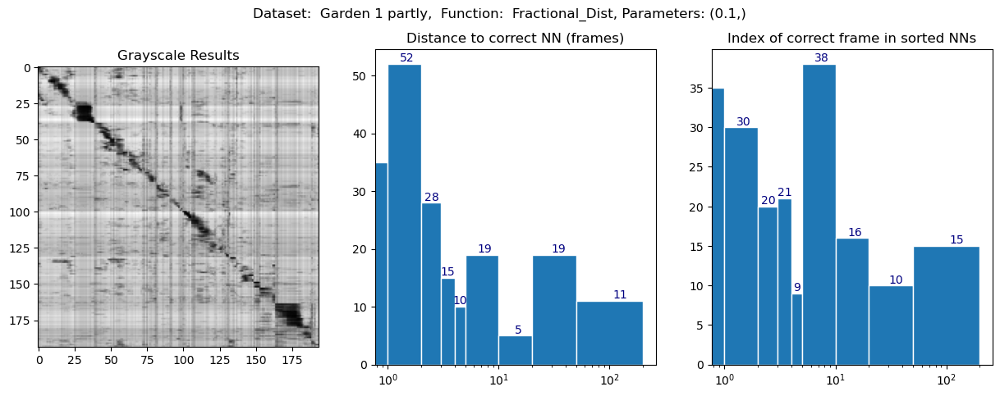

In [14]:
r, rdh, rr = nnt.run_and_evaluate_func_on_data(nnt.sequential_lk_dist, DS_garden_1[5:199,:], Q_garden_1[5:199,:], "Garden 1 partly", "Fractional_Dist", False, 0.1)

<h3>Garden PN</h3>

Duration Fractional_Dist: 2.5173650829819962 seconds
Median Distance to GT-NN: 2.0
Average Distance to GT-NN: 9.097938144329897
Median Rank of GT-NN: 3.0
Average Rank of GT-NN: 15.20103092783505
114 out of 194 within top 5 NNs


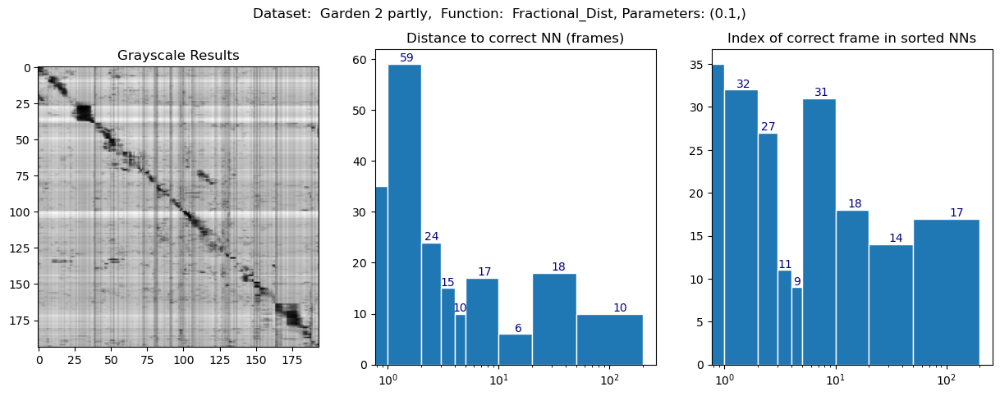

In [5]:
r, rdh, rr = nnt.run_and_evaluate_func_on_data(nnt.sequential_lk_dist, DS_garden_2[5:199,:], Q_garden_2[5:199,:], "Garden 2 partly", "Fractional_Dist", False, 0.1)

<h2>Number of matching Dimensions</h2>

<h3>Garden Points BZ</h3>

Duration Count Common Dimensions: 3.1520508750109 seconds
Median Distance to GT-NN: 2.0
Average Distance to GT-NN: 10.405
Median Rank of GT-NN: 3.0
Average Rank of GT-NN: 11.915
122 out of 200 within top 5 NNs


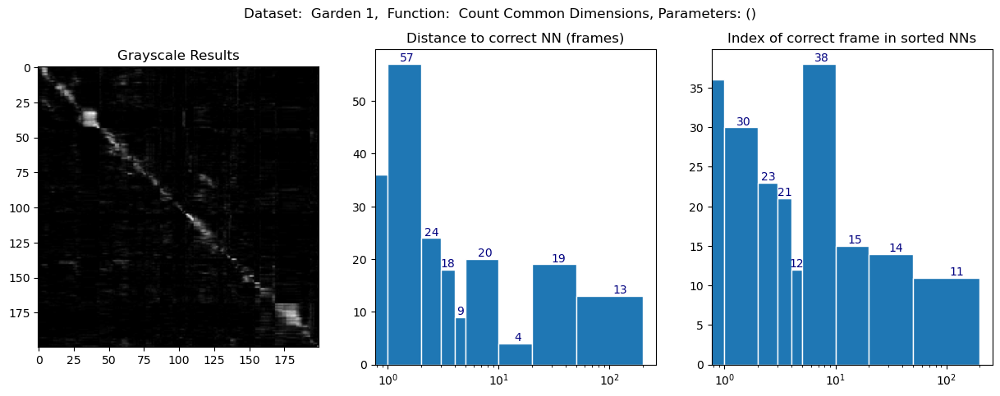

In [16]:
r, rdh, rr = nnt.run_and_evaluate_func_on_data(nnt.compute_matching_dimensions_sequential, DS_garden_1, Q_garden_1, "Garden 1", "Count Common Dimensions", True)

<h3>Garden Points PN</h3>

Duration Count Common Dimensions: 3.791701416950673 seconds
Median Distance to GT-NN: 1.0
Average Distance to GT-NN: 8.21
Median Rank of GT-NN: 3.0
Average Rank of GT-NN: 13.38
123 out of 200 within top 5 NNs


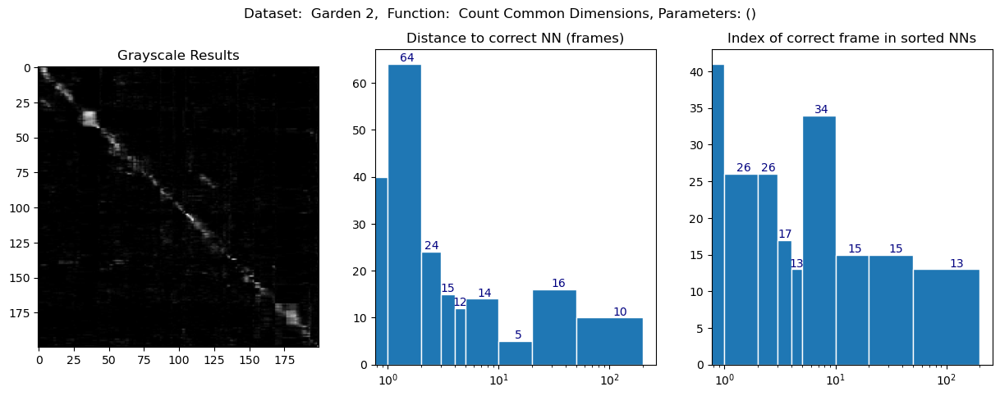

In [17]:
r, rdh, rr = nnt.run_and_evaluate_func_on_data(nnt.compute_matching_dimensions_sequential, DS_garden_2, Q_garden_2, "Garden 2", "Count Common Dimensions", True)

<h3>Nordland</h3>

Duration Count Common Dimensions: 1225.2245690840064 seconds
Median Distance to GT-NN: 0.0
Average Distance to GT-NN: 28.608
Median Rank of GT-NN: 0.0
Average Rank of GT-NN: 6.556
949 out of 1000 within top 5 NNs


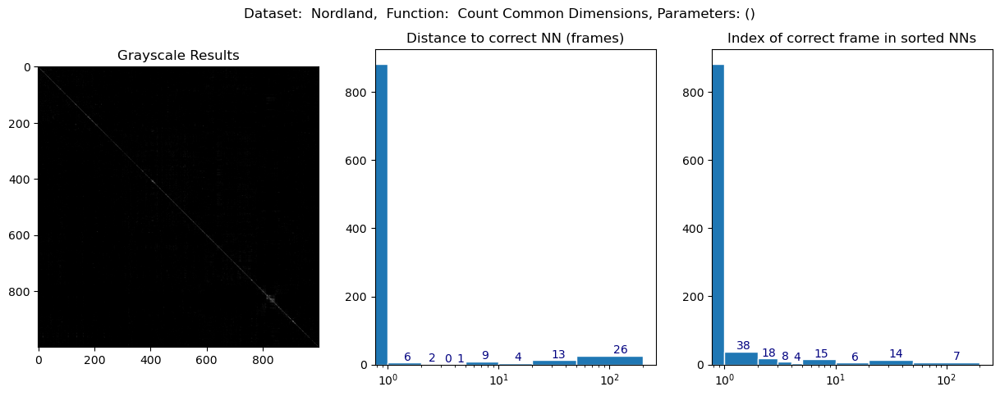

In [18]:
r, rdh, rr = nnt.run_and_evaluate_func_on_data(nnt.compute_matching_dimensions_sequential, nl_spring_seer, nl_winter_seer, "Nordland", "Count Common Dimensions", True)

<h2>Number of Matching Dimensions with Index structure</h2>

<h3>Garden BZ</h3>

Duration Count Common Dimensions with Index Structure: 0.051127125043421984 seconds
Median Distance to GT-NN: 2.0
Average Distance to GT-NN: 10.405
Median Rank of GT-NN: 3.0
Average Rank of GT-NN: 11.915
122 out of 200 within top 5 NNs


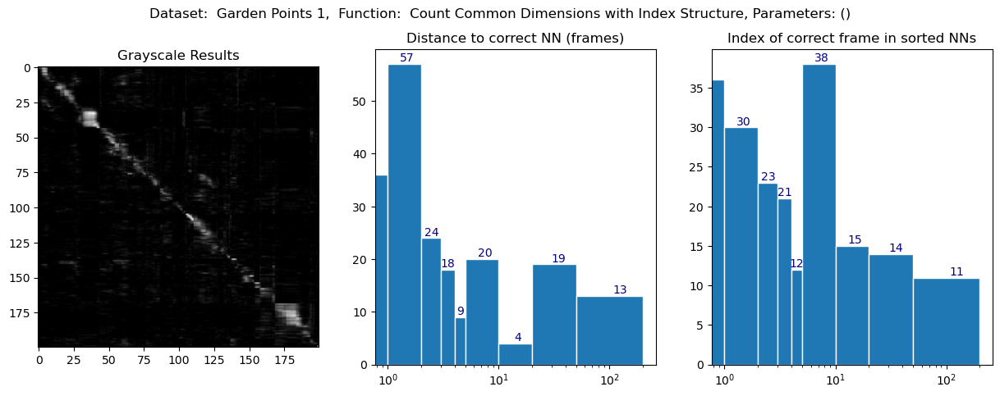

In [6]:
r, rdh, rr = nnt.run_and_evaluate_func_on_data(nnt.compute_matching_dimensions_w_index, DS_garden_1, Q_garden_1, "Garden Points 1", "Count Common Dimensions with Index Structure", True)

<h3>Garden PN</h3>

Duration Count Common Dimensions with Index Structure: 0.05745629093144089 seconds
Median Distance to GT-NN: 1.0
Average Distance to GT-NN: 8.21
Median Rank of GT-NN: 3.0
Average Rank of GT-NN: 13.38
123 out of 200 within top 5 NNs


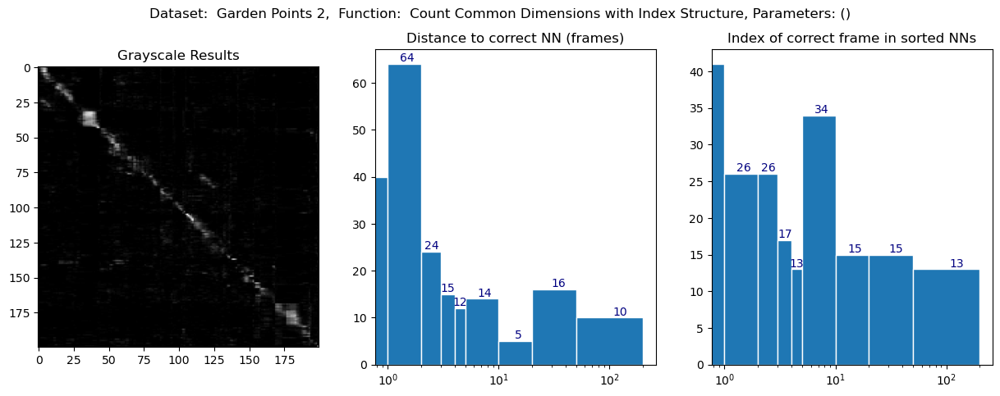

In [7]:
r, rdh, rr = nnt.run_and_evaluate_func_on_data(nnt.compute_matching_dimensions_w_index, DS_garden_2, Q_garden_2, "Garden Points 2", "Count Common Dimensions with Index Structure", True)

<h3>Nordland</h3>

Duration Count Common Dimensions with Index Structure: 1.2189661669544876 seconds
Median Distance to GT-NN: 0.0
Average Distance to GT-NN: 28.608
Median Rank of GT-NN: 0.0
Average Rank of GT-NN: 6.556
949 out of 1000 within top 5 NNs


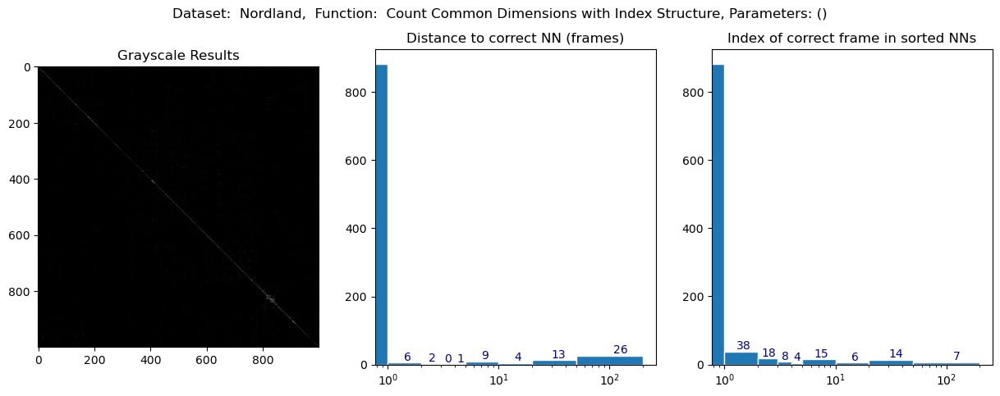

In [21]:
r, rdh, rr = nnt.run_and_evaluate_func_on_data(nnt.compute_matching_dimensions_w_index, nl_spring_seer, nl_winter_seer, "Nordland", "Count Common Dimensions with Index Structure", True)

<h2>Distance on Matching Dimensions</h2>

<h3>k=2</h3>

<h4>Garden BZ</h4>

Duration Distance on Common Dimensions: 5.262267958023585 seconds
Median Distance to GT-NN: 54.0
Average Distance to GT-NN: 60.57
Median Rank of GT-NN: 74.5
Average Rank of GT-NN: 75.345
0 out of 200 within top 5 NNs


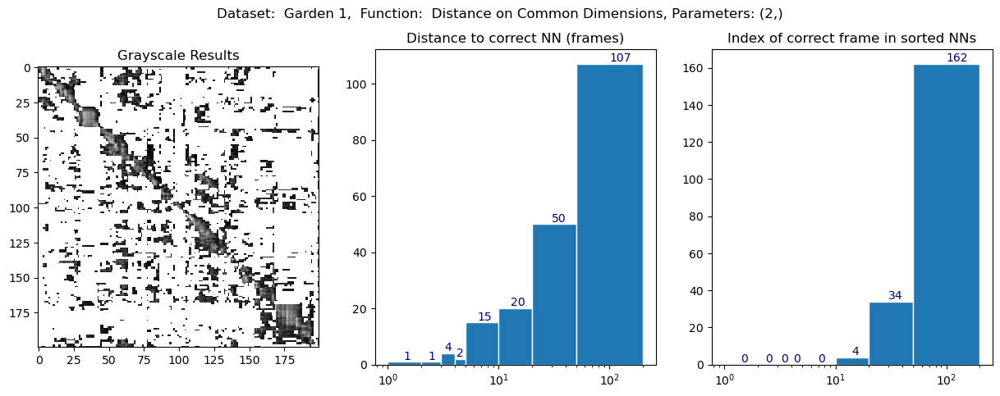

In [22]:
r, rdh, rr = nnt.run_and_evaluate_func_on_data(nnt.compute_dist_on_matching_dimensions_sequential, DS_garden_1, Q_garden_1, "Garden 1", "Distance on Common Dimensions", False, 2)

<h4>Garden PN</h4>

Duration Distance on Common Dimensions: 5.250116667011753 seconds
Median Distance to GT-NN: 49.5
Average Distance to GT-NN: 59.76
Median Rank of GT-NN: 54.5
Average Rank of GT-NN: 55.77
2 out of 200 within top 5 NNs


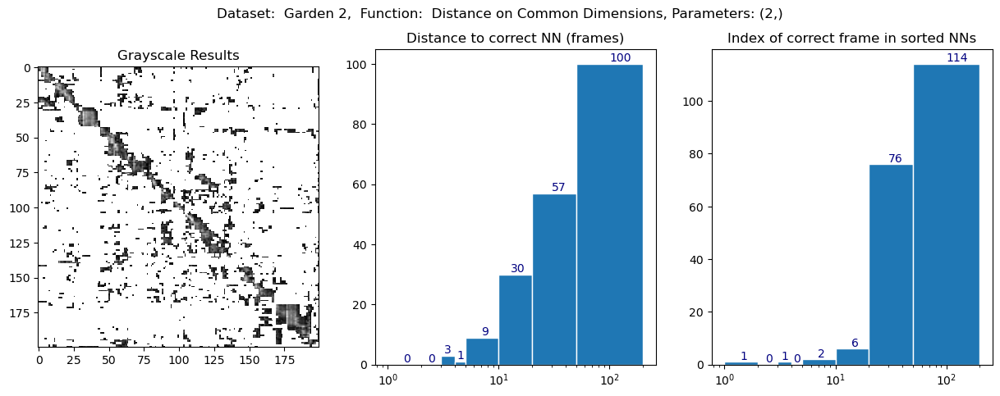

In [23]:
r, rdh, rr = nnt.run_and_evaluate_func_on_data(nnt.compute_dist_on_matching_dimensions_sequential, DS_garden_2, Q_garden_2, "Garden 2", "Distance on Common Dimensions", False, 2)

<h4>Nordland</h4>

Duration Distance on Common Dimensions: 705.7389984999318 seconds
Median Distance to GT-NN: 247.0
Average Distance to GT-NN: 308.368
Median Rank of GT-NN: 81.0
Average Rank of GT-NN: 87.887
0 out of 1000 within top 5 NNs


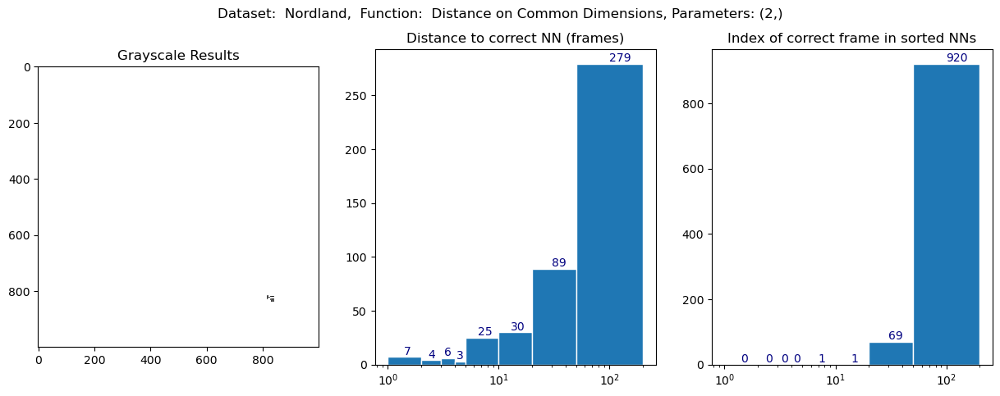

In [24]:
r, rdh, rr = nnt.run_and_evaluate_func_on_data(nnt.compute_dist_on_matching_dimensions_sequential, nl_spring_seer, nl_winter_seer, "Nordland", "Distance on Common Dimensions", False, 2)

<h3>k=1</h3>

<h4>Garden BZ</h4>

Duration Distance on Common Dimensions: 5.237995582981966 seconds
Median Distance to GT-NN: 54.5
Average Distance to GT-NN: 61.215
Median Rank of GT-NN: 77.0
Average Rank of GT-NN: 77.105
0 out of 200 within top 5 NNs


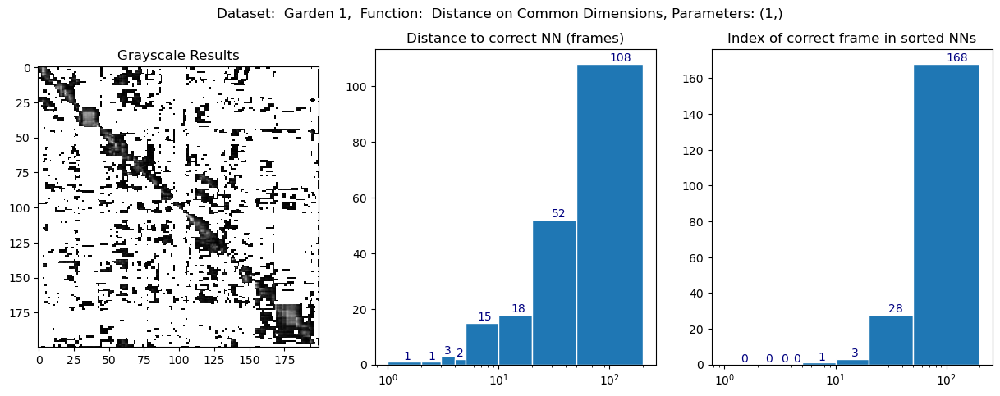

In [25]:
r, rdh, rr = nnt.run_and_evaluate_func_on_data(nnt.compute_dist_on_matching_dimensions_sequential, DS_garden_1, Q_garden_1, "Garden 1", "Distance on Common Dimensions", False, 1)

<h4>Garden PN</h4>

Duration Distance on Common Dimensions: 5.245125207933597 seconds
Median Distance to GT-NN: 50.0
Average Distance to GT-NN: 60.405
Median Rank of GT-NN: 58.0
Average Rank of GT-NN: 56.915
2 out of 200 within top 5 NNs


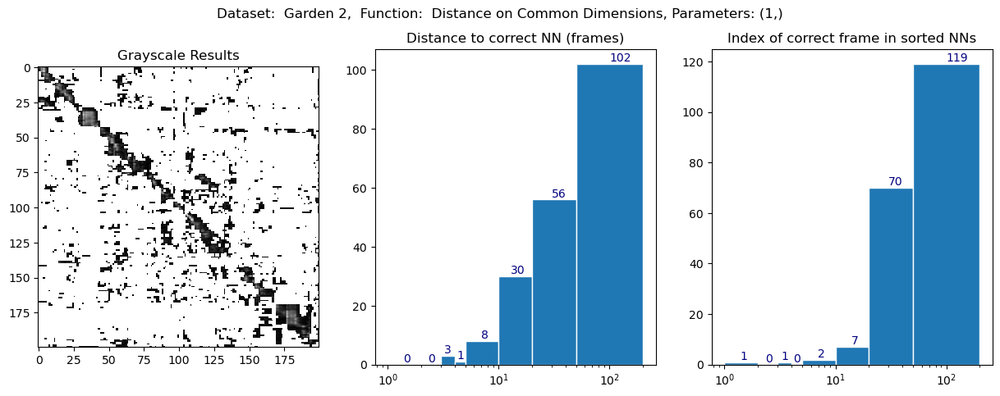

In [26]:
r, rdh, rr = nnt.run_and_evaluate_func_on_data(nnt.compute_dist_on_matching_dimensions_sequential, DS_garden_2, Q_garden_2, "Garden 2", "Distance on Common Dimensions", False, 1)

<h4>Nordland</h4>

Duration Distance on Common Dimensions: 705.5217192090349 seconds
Median Distance to GT-NN: 245.0
Average Distance to GT-NN: 307.447
Median Rank of GT-NN: 81.0
Average Rank of GT-NN: 87.907
0 out of 1000 within top 5 NNs


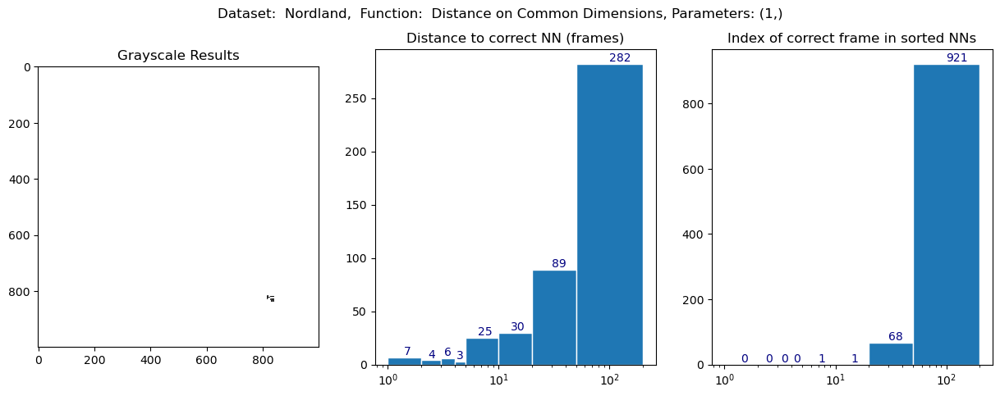

In [27]:
r, rdh, rr = nnt.run_and_evaluate_func_on_data(nnt.compute_dist_on_matching_dimensions_sequential, nl_spring_seer, nl_winter_seer, "Nordland", "Distance on Common Dimensions", False, 1)

<h3>k=0.1</h3>

<h4>Garden BZ</h4>

Duration Distance on Common Dimensions: 5.254304375033826 seconds
Median Distance to GT-NN: 54.0
Average Distance to GT-NN: 60.535
Median Rank of GT-NN: 79.0
Average Rank of GT-NN: 77.65
0 out of 200 within top 5 NNs


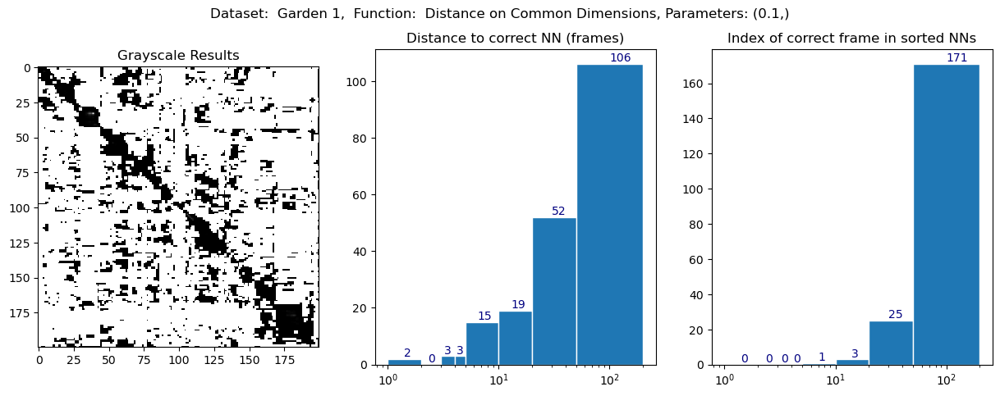

In [28]:
r, rdh, rr = nnt.run_and_evaluate_func_on_data(nnt.compute_dist_on_matching_dimensions_sequential, DS_garden_1, Q_garden_1, "Garden 1", "Distance on Common Dimensions", False, 0.1)

<h4>Garden PN</h4>

Duration Distance on Common Dimensions: 5.18414824991487 seconds
Median Distance to GT-NN: 50.0
Average Distance to GT-NN: 59.32
Median Rank of GT-NN: 57.0
Average Rank of GT-NN: 58.17
1 out of 200 within top 5 NNs


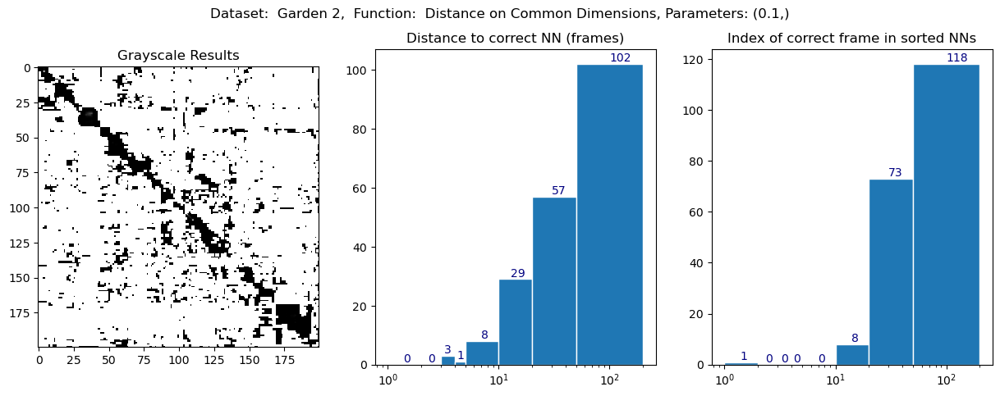

In [29]:
r, rdh, rr = nnt.run_and_evaluate_func_on_data(nnt.compute_dist_on_matching_dimensions_sequential, DS_garden_2, Q_garden_2, "Garden 2", "Distance on Common Dimensions", False, 0.1)

<h4>Nordland</h4>

Duration Distance on Common Dimensions: 708.3970546670025 seconds
Median Distance to GT-NN: 240.5
Average Distance to GT-NN: 305.521
Median Rank of GT-NN: 81.0
Average Rank of GT-NN: 87.699
0 out of 1000 within top 5 NNs


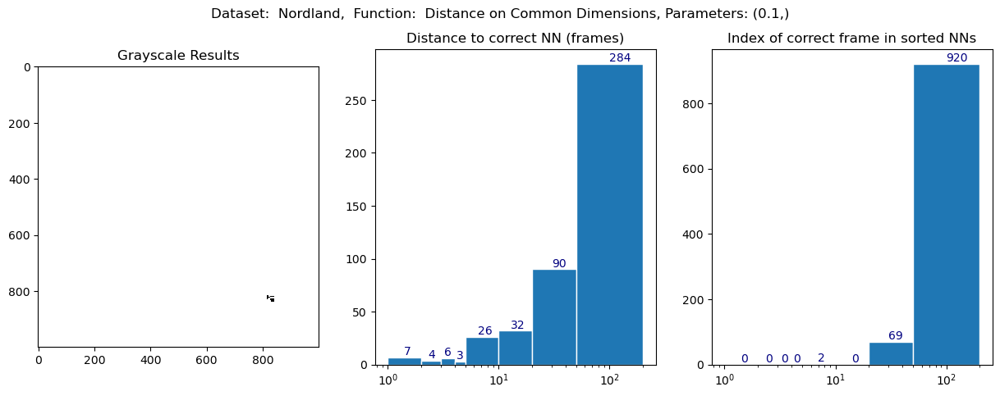

In [30]:
r, rdh, rr = nnt.run_and_evaluate_func_on_data(nnt.compute_dist_on_matching_dimensions_sequential, nl_spring_seer, nl_winter_seer, "Nordland", "Distance on Common Dimensions", False, 0.1)

<h2>Distance on Matching Dimensions partly normalized</h2>

<h3>k=3</h3>

<h4>Garden BZ</h4>

Duration Distance on Common Dimensions partly normalized: 5.305701541947201 seconds
Median Distance to GT-NN: 51.5
Average Distance to GT-NN: 58.77
Median Rank of GT-NN: 18.0
Average Rank of GT-NN: 27.38
8 out of 200 within top 5 NNs


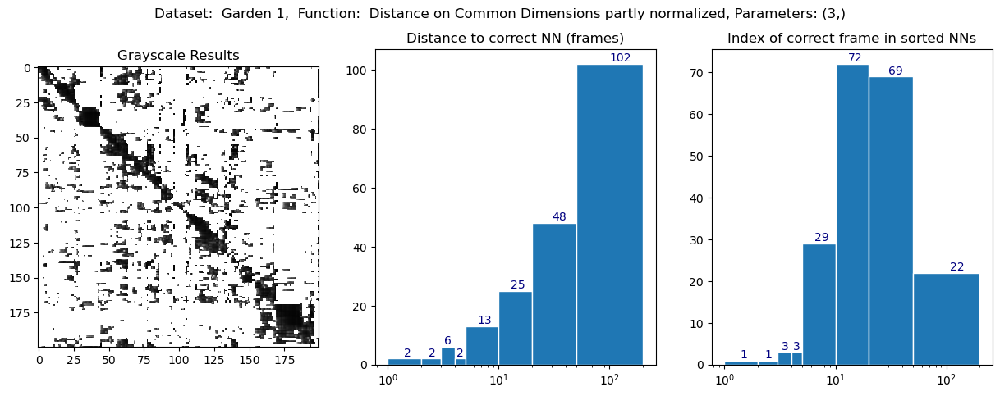

In [31]:
r, rdh, rr = nnt.run_and_evaluate_func_on_data(nnt.compute_dist_on_matching_dimensions_normalized_sequential, DS_garden_1, Q_garden_1, "Garden 1", "Distance on Common Dimensions partly normalized", False, 3)

<h4>Garden PN</h4>

Duration Distance on Common Dimensions partly normalized: 5.277707208995707 seconds
Median Distance to GT-NN: 42.0
Average Distance to GT-NN: 54.28
Median Rank of GT-NN: 11.5
Average Rank of GT-NN: 20.465
23 out of 200 within top 5 NNs


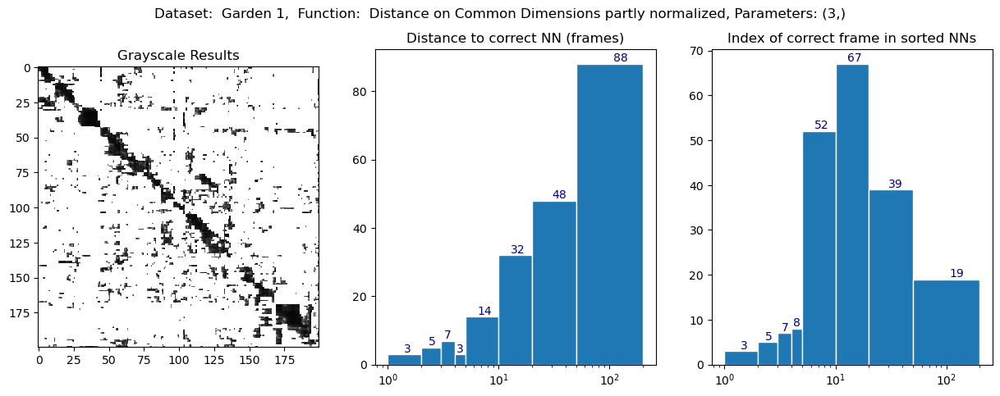

In [32]:
r, rdh, rr = nnt.run_and_evaluate_func_on_data(nnt.compute_dist_on_matching_dimensions_normalized_sequential, DS_garden_2, Q_garden_2, "Garden 1", "Distance on Common Dimensions partly normalized", False, 3)

<h4>Nordland</h4>

Duration Distance on Common Dimensions partly normalized: 706.9050501249731 seconds
Median Distance to GT-NN: 235.0
Average Distance to GT-NN: 300.535
Median Rank of GT-NN: 29.0
Average Rank of GT-NN: 39.919
3 out of 1000 within top 5 NNs


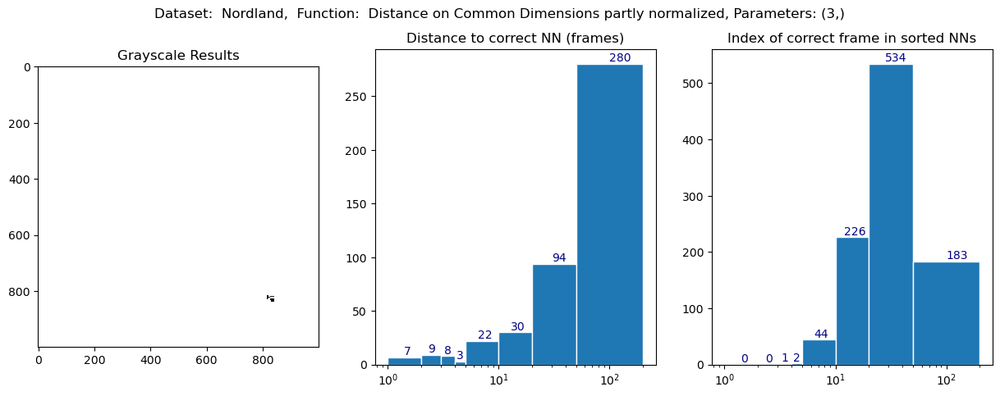

In [33]:
r, rdh, rr = nnt.run_and_evaluate_func_on_data(nnt.compute_dist_on_matching_dimensions_normalized_sequential, nl_spring_seer, nl_winter_seer, "Nordland", "Distance on Common Dimensions partly normalized", False, 3)

<h3>k=2</h3>

<h4>Garden BZ</h4>

Duration Distance on Common Dimensions partly normalized: 5.225641540950164 seconds
Median Distance to GT-NN: 54.0
Average Distance to GT-NN: 60.795
Median Rank of GT-NN: 22.5
Average Rank of GT-NN: 31.635
1 out of 200 within top 5 NNs


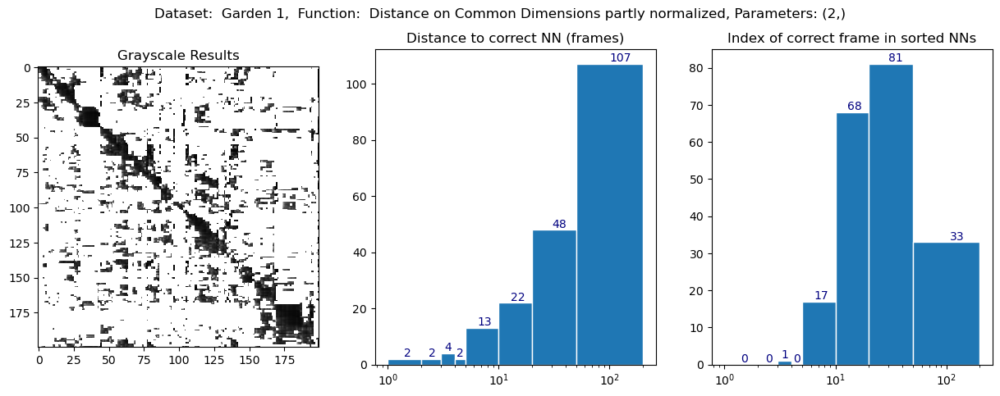

In [34]:
r, rdh, rr = nnt.run_and_evaluate_func_on_data(nnt.compute_dist_on_matching_dimensions_normalized_sequential, DS_garden_1, Q_garden_1, "Garden 1", "Distance on Common Dimensions partly normalized", False, 2)

<h4>Garden PN</h4>

Duration Distance on Common Dimensions partly normalized: 5.182576958090067 seconds
Median Distance to GT-NN: 47.5
Average Distance to GT-NN: 58.26
Median Rank of GT-NN: 14.5
Average Rank of GT-NN: 23.265
9 out of 200 within top 5 NNs


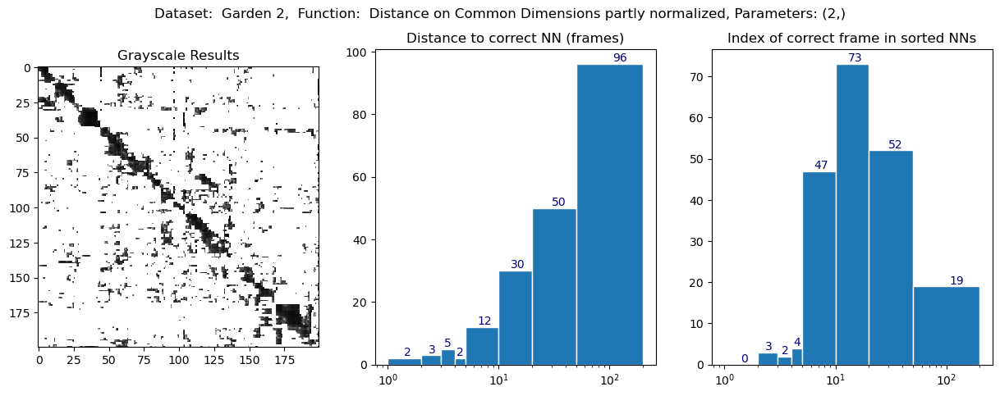

In [35]:
r, rdh, rr = nnt.run_and_evaluate_func_on_data(nnt.compute_dist_on_matching_dimensions_normalized_sequential, DS_garden_2, Q_garden_2, "Garden 2", "Distance on Common Dimensions partly normalized", False, 2)

<h4>Nordland</h4>

Duration Distance on Common Dimensions partly normalized: 705.2055395840434 seconds
Median Distance to GT-NN: 239.5
Average Distance to GT-NN: 303.234
Median Rank of GT-NN: 45.0
Average Rank of GT-NN: 53.204
0 out of 1000 within top 5 NNs


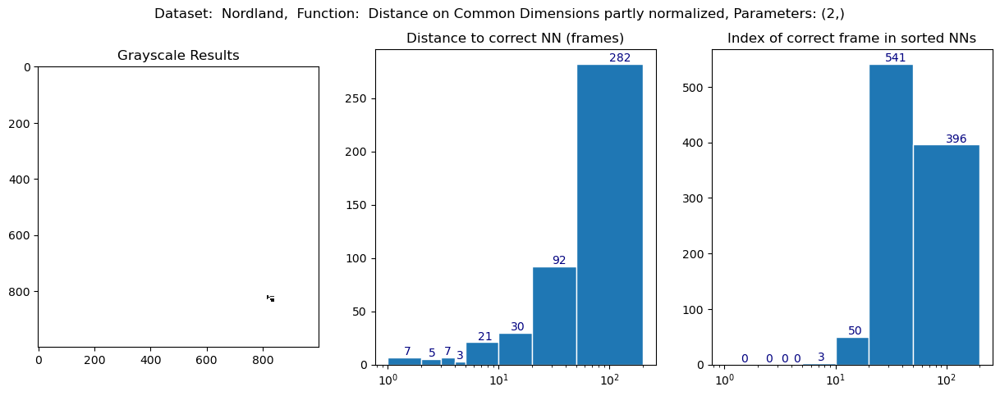

In [36]:
r, rdh, rr = nnt.run_and_evaluate_func_on_data(nnt.compute_dist_on_matching_dimensions_normalized_sequential, nl_spring_seer, nl_winter_seer, "Nordland", "Distance on Common Dimensions partly normalized", False, 2)

<h3>k=1</h3>

<h4>Garden BZ</h4>

Duration Distance on Common Dimensions partly normalized: 5.259999415953644 seconds
Median Distance to GT-NN: 54.0
Average Distance to GT-NN: 60.87
Median Rank of GT-NN: 50.0
Average Rank of GT-NN: 54.765
0 out of 200 within top 5 NNs


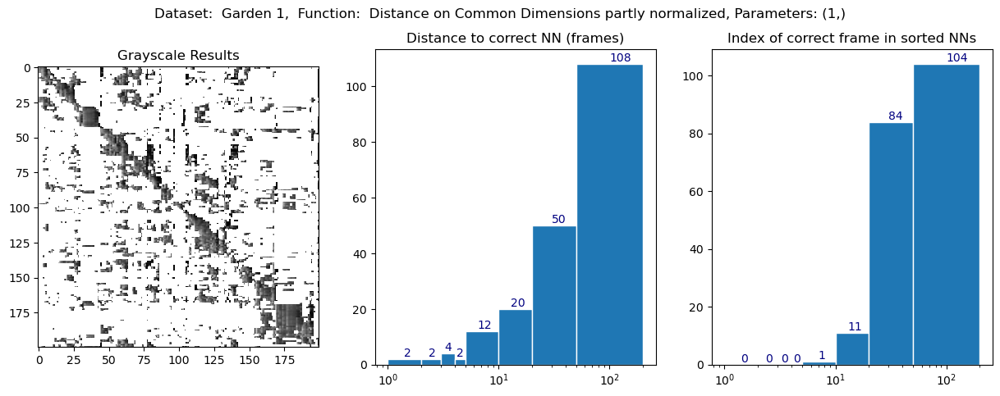

In [37]:
r, rdh, rr = nnt.run_and_evaluate_func_on_data(nnt.compute_dist_on_matching_dimensions_normalized_sequential, DS_garden_1, Q_garden_1, "Garden 1", "Distance on Common Dimensions partly normalized", False, 1)

<h4>Garden PN</h4>

Duration Distance on Common Dimensions partly normalized: 5.197831625002436 seconds
Median Distance to GT-NN: 48.5
Average Distance to GT-NN: 60.595
Median Rank of GT-NN: 35.0
Average Rank of GT-NN: 38.835
2 out of 200 within top 5 NNs


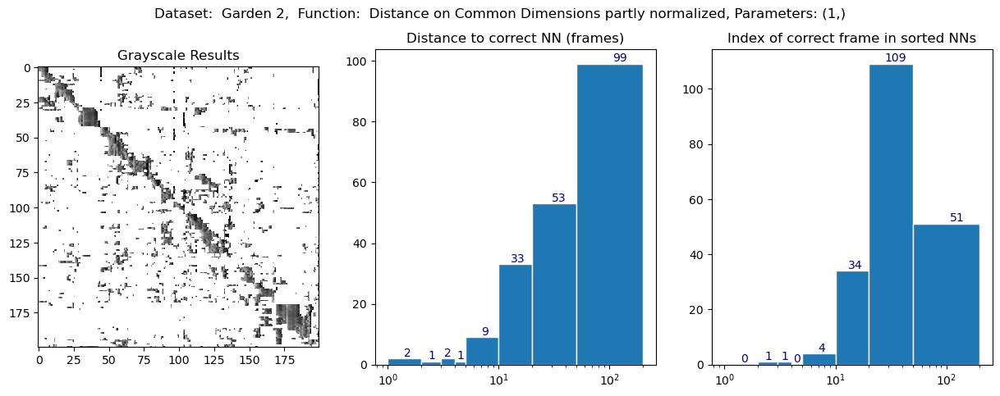

In [38]:
r, rdh, rr = nnt.run_and_evaluate_func_on_data(nnt.compute_dist_on_matching_dimensions_normalized_sequential, DS_garden_2, Q_garden_2, "Garden 2", "Distance on Common Dimensions partly normalized", False, 1)

<h4>Nordland</h4>

Duration Distance on Common Dimensions partly normalized: 708.4342564159306 seconds
Median Distance to GT-NN: 240.5
Average Distance to GT-NN: 304.424
Median Rank of GT-NN: 69.0
Average Rank of GT-NN: 75.27
0 out of 1000 within top 5 NNs


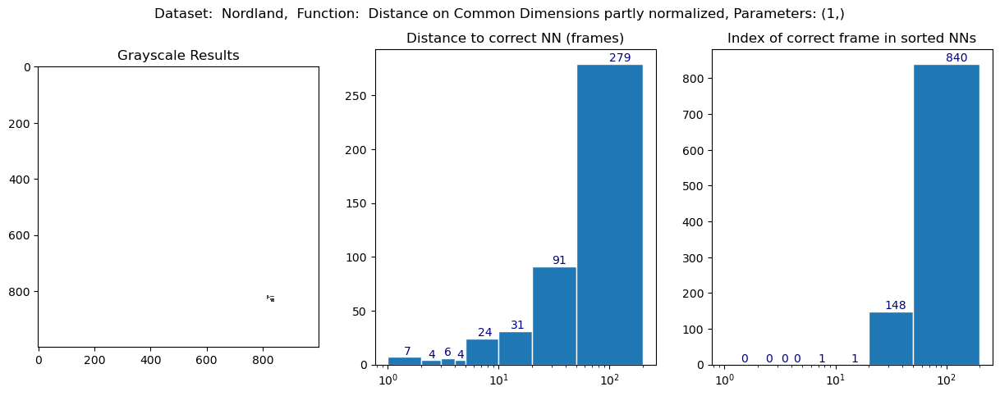

In [39]:
r, rdh, rr = nnt.run_and_evaluate_func_on_data(nnt.compute_dist_on_matching_dimensions_normalized_sequential, nl_spring_seer, nl_winter_seer, "Nordland", "Distance on Common Dimensions partly normalized", False, 1)

<h3>k=0.1</h3>

<h4>Garden BZ</h4>

Duration Distance on Common Dimensions partly normalized: 5.298285957891494 seconds
Median Distance to GT-NN: 54.0
Average Distance to GT-NN: 60.535
Median Rank of GT-NN: 79.0
Average Rank of GT-NN: 77.655
0 out of 200 within top 5 NNs


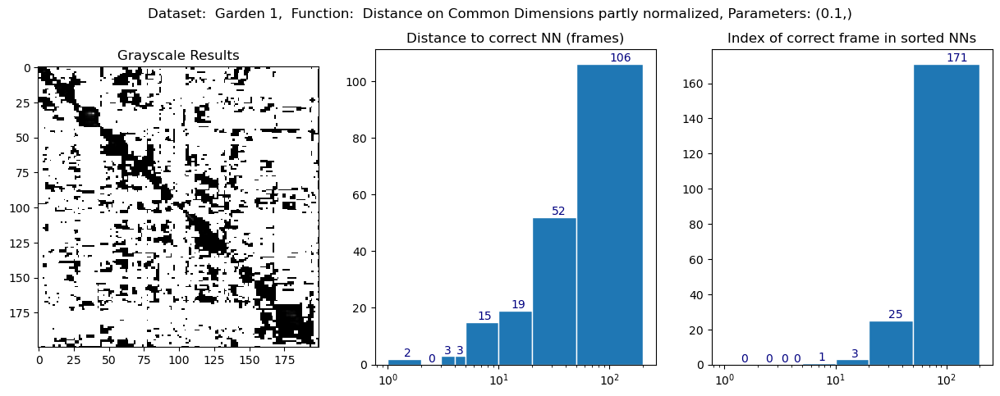

In [40]:
r, rdh, rr = nnt.run_and_evaluate_func_on_data(nnt.compute_dist_on_matching_dimensions_normalized_sequential, DS_garden_1, Q_garden_1, "Garden 1", "Distance on Common Dimensions partly normalized", False, 0.1)

<h4>Garden PN</h4>

Duration Distance on Common Dimensions partly normalized: 5.248922417056747 seconds
Median Distance to GT-NN: 50.0
Average Distance to GT-NN: 59.32
Median Rank of GT-NN: 57.0
Average Rank of GT-NN: 58.165
1 out of 200 within top 5 NNs


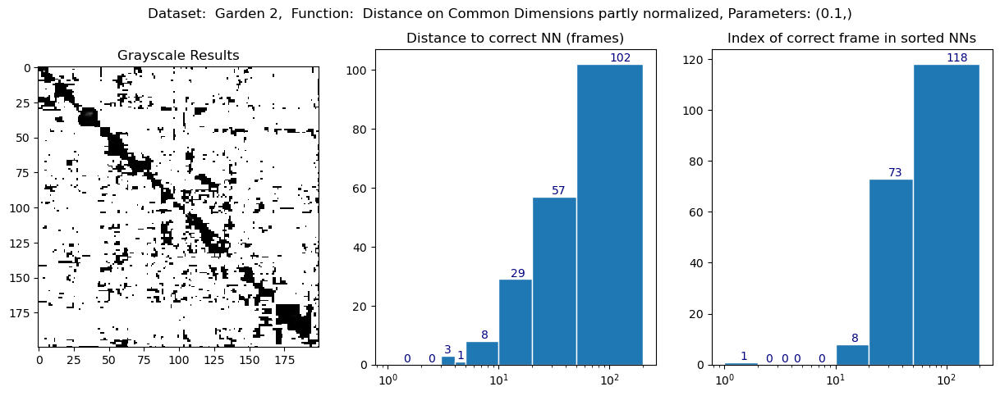

In [41]:
r, rdh, rr = nnt.run_and_evaluate_func_on_data(nnt.compute_dist_on_matching_dimensions_normalized_sequential, DS_garden_2, Q_garden_2, "Garden 2", "Distance on Common Dimensions partly normalized", False, 0.1)

<h4>Nordland</h4>

Duration Distance on Common Dimensions partly normalized: 704.6410774590913 seconds
Median Distance to GT-NN: 240.5
Average Distance to GT-NN: 305.521
Median Rank of GT-NN: 81.0
Average Rank of GT-NN: 87.7
0 out of 1000 within top 5 NNs


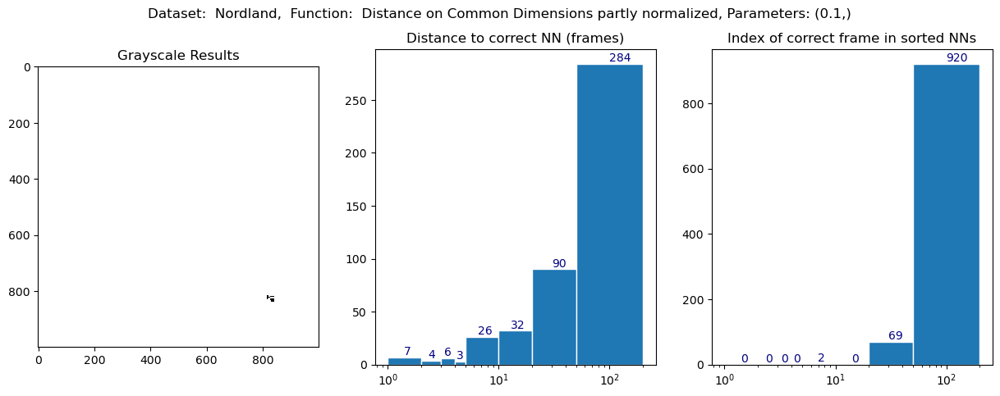

In [42]:
r, rdh, rr = nnt.run_and_evaluate_func_on_data(nnt.compute_dist_on_matching_dimensions_normalized_sequential, nl_spring_seer, nl_winter_seer, "Nordland", "Distance on Common Dimensions partly normalized", False, 0.1)

<h2>PIDist without ranges</h2>

<h3>p=1</h3>

<h4>Garden BZ</h4>

/Users/bz/ma-nearest-neighbours/code/SEER/nntools.py:186: RuntimeWarning: divide by zero encountered in divide
  similarity = (np.sum( (1- differences / range_per_dim[common_indices])**p ))** (1/p)


Duration PIDist without ranges: 7.212028707959689 seconds
Median Distance to GT-NN: 3.0
Average Distance to GT-NN: 13.27
Median Rank of GT-NN: 11.0
Average Rank of GT-NN: 67.77
72 out of 200 within top 5 NNs


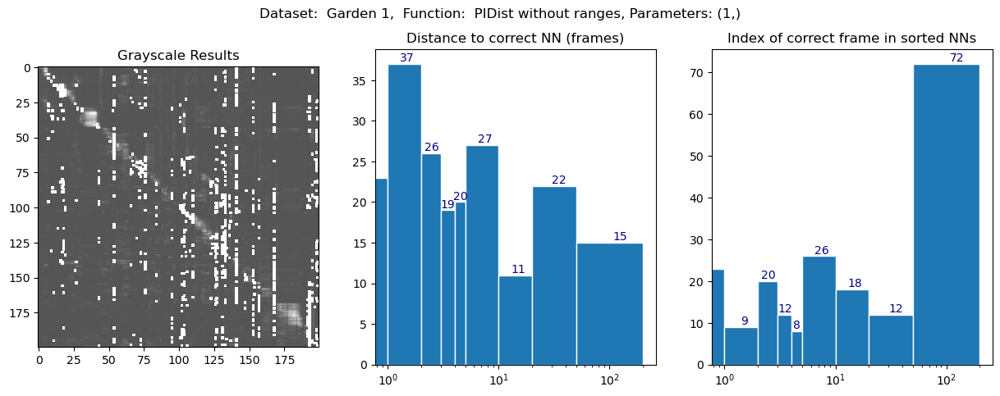

In [43]:
r, rdh, rr = nnt.run_and_evaluate_func_on_data(nnt.piDist_simple_sequential, DS_garden_1, Q_garden_1, "Garden 1", "PIDist without ranges", True, 1)

<h4>Garden PN</h4>

Duration PIDist without ranges: 8.511962041957304 seconds
Median Distance to GT-NN: 2.0
Average Distance to GT-NN: 10.325
Median Rank of GT-NN: 3.0
Average Rank of GT-NN: 14.595
117 out of 200 within top 5 NNs


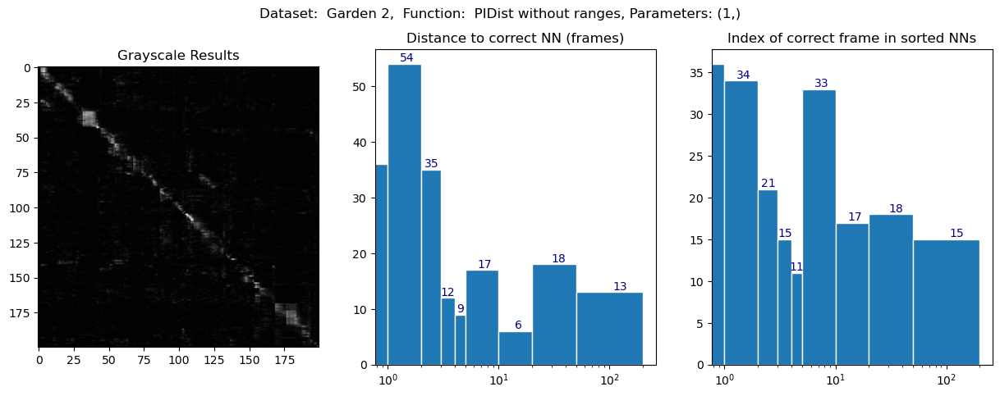

In [44]:
r, rdh, rr = nnt.run_and_evaluate_func_on_data(nnt.piDist_simple_sequential, DS_garden_2, Q_garden_2, "Garden 2", "PIDist without ranges", True, 1)

<h4>Nordland</h4>

Duration PIDist without ranges: 760.4459118749946 seconds
Median Distance to GT-NN: 82.0
Average Distance to GT-NN: 183.225
Median Rank of GT-NN: 994.0
Average Rank of GT-NN: 960.713
12 out of 1000 within top 5 NNs


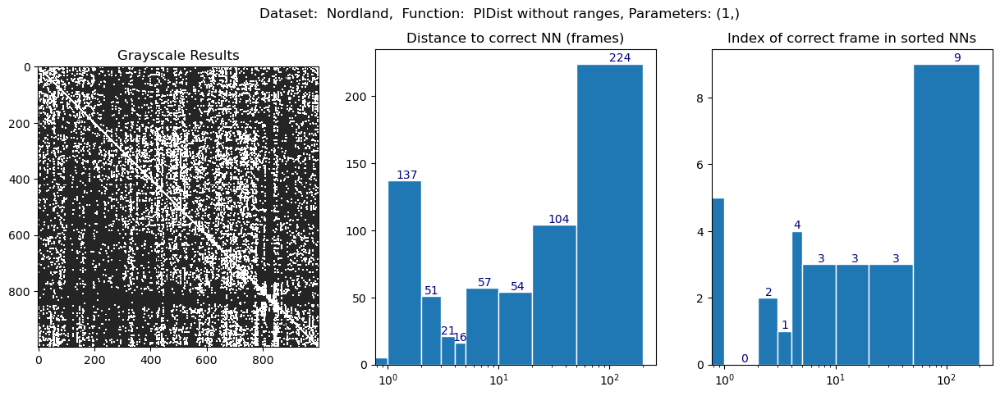

In [45]:
r, rdh, rr = nnt.run_and_evaluate_func_on_data(nnt.piDist_simple_sequential, nl_spring_seer, nl_winter_seer, "Nordland", "PIDist without ranges", True, 1)

<h3>p=0.1</h3>

<h4>Garden BZ</h4>

/Users/bz/ma-nearest-neighbours/code/SEER/nntools.py:186: RuntimeWarning: invalid value encountered in power
  similarity = (np.sum( (1- differences / range_per_dim[common_indices])**p ))** (1/p)


Duration PIDist without ranges: 7.208967000013217 seconds
Median Distance to GT-NN: 85.5
Average Distance to GT-NN: 83.98
Median Rank of GT-NN: 16.0
Average Rank of GT-NN: 23.575
31 out of 200 within top 5 NNs


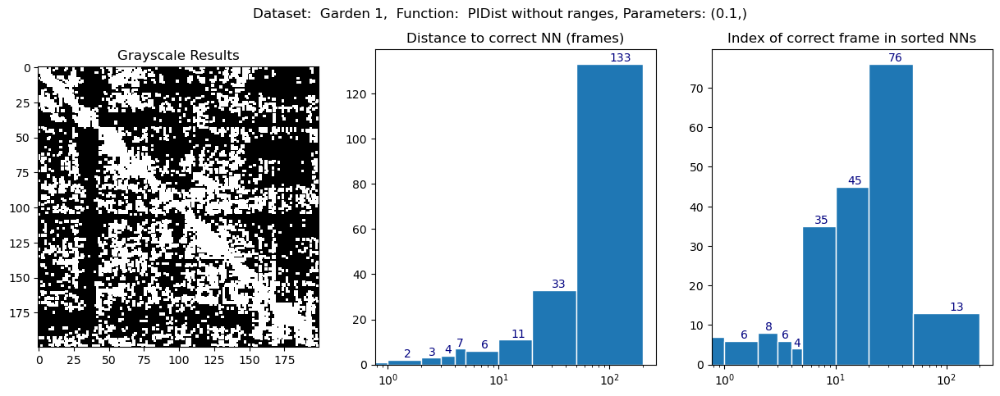

In [46]:
r, rdh, rr = nnt.run_and_evaluate_func_on_data(nnt.piDist_simple_sequential, DS_garden_1, Q_garden_1, "Garden 1", "PIDist without ranges", True, 0.1)

<h4>Garden PN</h4>

Duration PIDist without ranges: 8.5246324170148 seconds
Median Distance to GT-NN: 2.0
Average Distance to GT-NN: 16.94
Median Rank of GT-NN: 3.0
Average Rank of GT-NN: 13.19
123 out of 200 within top 5 NNs


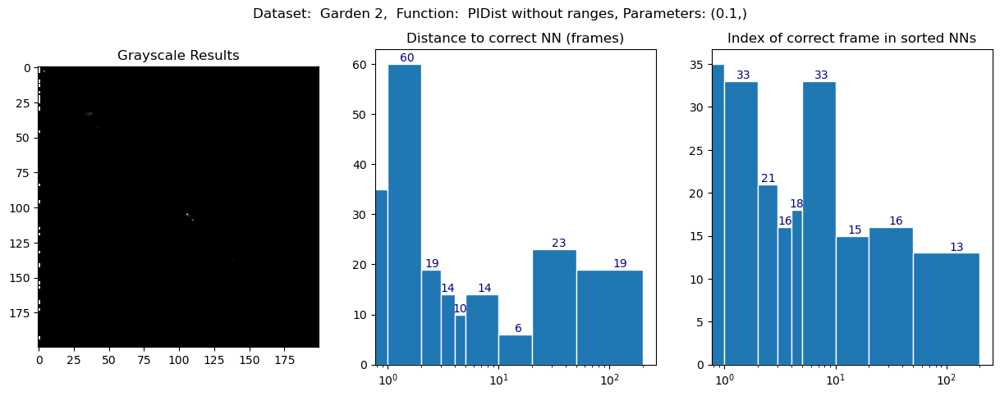

In [47]:
r, rdh, rr = nnt.run_and_evaluate_func_on_data(nnt.piDist_simple_sequential, DS_garden_2, Q_garden_2, "Garden 2", "PIDist without ranges", True, 0.1)

<h4>Nordland</h4>

Duration PIDist without ranges: 761.7243016659049 seconds
Median Distance to GT-NN: 289.0
Average Distance to GT-NN: 368.634
Median Rank of GT-NN: 9.0
Average Rank of GT-NN: 15.817
252 out of 1000 within top 5 NNs


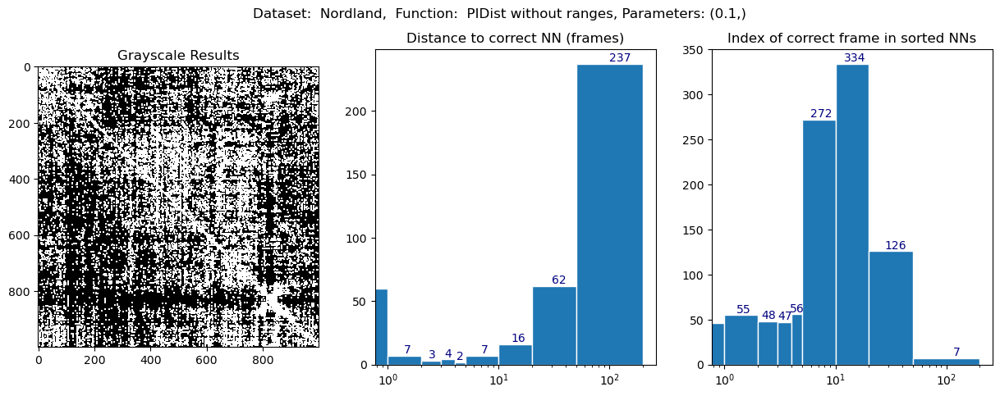

In [48]:
r, rdh, rr = nnt.run_and_evaluate_func_on_data(nnt.piDist_simple_sequential, nl_spring_seer, nl_winter_seer, "Nordland", "PIDist without ranges", True, 0.1)

<h3>p=2</h3>

<h4>Garden BZ</h4>

Duration PIDist without ranges: 7.126841334044002 seconds
Median Distance to GT-NN: 32.0
Average Distance to GT-NN: 46.795
Median Rank of GT-NN: 7.5
Average Rank of GT-NN: 17.69
60 out of 200 within top 5 NNs


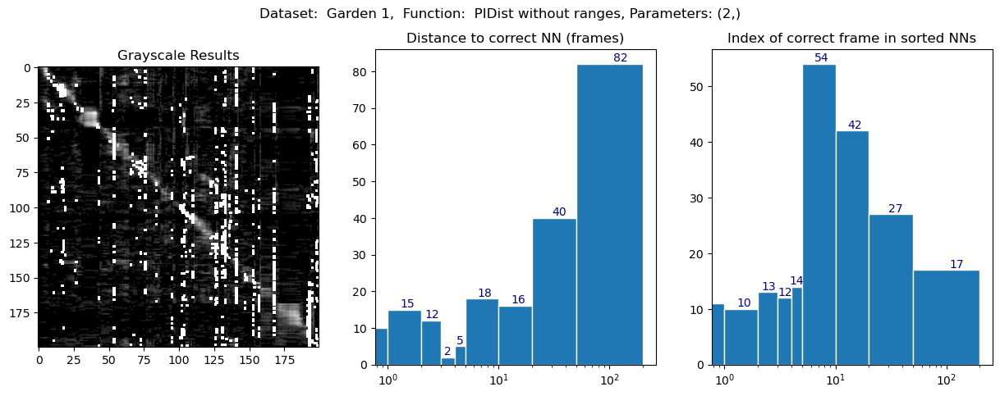

In [49]:
r, rdh, rr = nnt.run_and_evaluate_func_on_data(nnt.piDist_simple_sequential, DS_garden_1, Q_garden_1, "Garden 1", "PIDist without ranges", True, 2)

<h4>Garden PN</h4>

Duration PIDist without ranges: 8.487803083029576 seconds
Median Distance to GT-NN: 2.0
Average Distance to GT-NN: 15.885
Median Rank of GT-NN: 4.0
Average Rank of GT-NN: 15.39
109 out of 200 within top 5 NNs


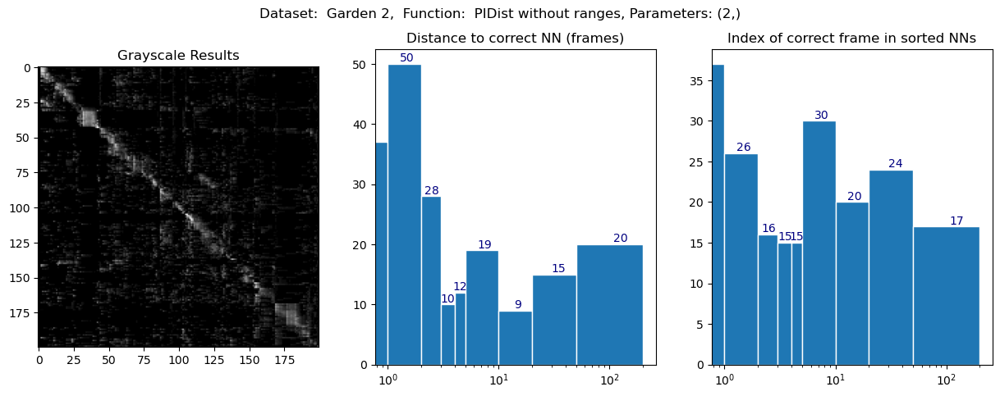

In [50]:
r, rdh, rr = nnt.run_and_evaluate_func_on_data(nnt.piDist_simple_sequential, DS_garden_2, Q_garden_2, "Garden 2", "PIDist without ranges", True, 2)

<h4>Nordland</h4>

Duration PIDist without ranges: 762.4973398749717 seconds
Median Distance to GT-NN: 250.0
Average Distance to GT-NN: 334.528
Median Rank of GT-NN: 4.0
Average Rank of GT-NN: 12.021
503 out of 1000 within top 5 NNs


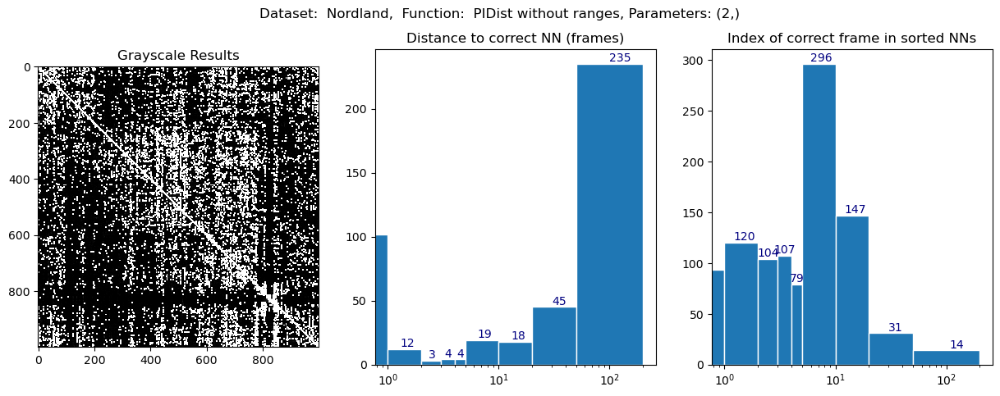

In [51]:
r, rdh, rr = nnt.run_and_evaluate_func_on_data(nnt.piDist_simple_sequential, nl_spring_seer, nl_winter_seer, "Nordland", "PIDist without ranges", True, 2)

<h2>PIDist with Threshold</h2>

<h3>p = 1, t = 0,5</h3>

<h4>Garden BZ</h4>

Duration PIDist with threshold: 7.306712874909863 seconds
Median Distance to GT-NN: 3.0
Average Distance to GT-NN: 13.04
Median Rank of GT-NN: 6.0
Average Rank of GT-NN: 25.955
84 out of 200 within top 5 NNs


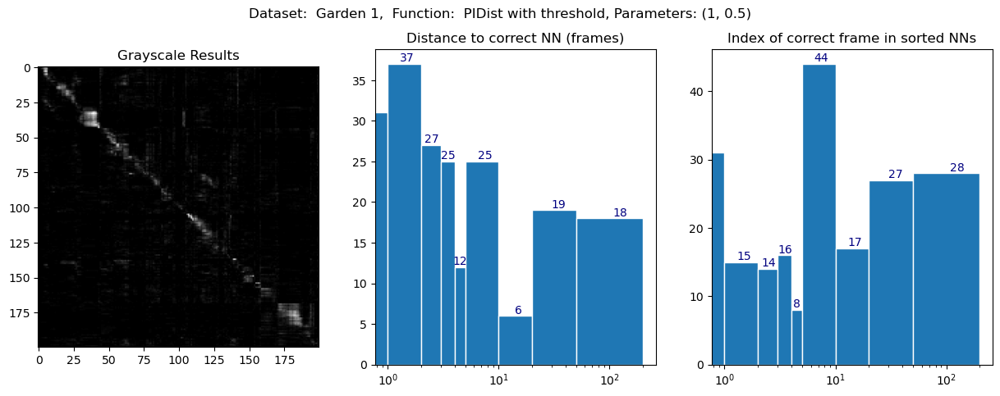

In [52]:
r, rdh, rr = nnt.run_and_evaluate_func_on_data(nnt.piDist_threshold_sequential, DS_garden_1, Q_garden_1, "Garden 1", "PIDist with threshold", True, 1, 0.5)

<h4>Garden PN</h4>

Duration PIDist with threshold: 8.706187459058128 seconds
Median Distance to GT-NN: 96.0
Average Distance to GT-NN: 97.54
Median Rank of GT-NN: 99.5
Average Rank of GT-NN: 98.795
7 out of 200 within top 5 NNs


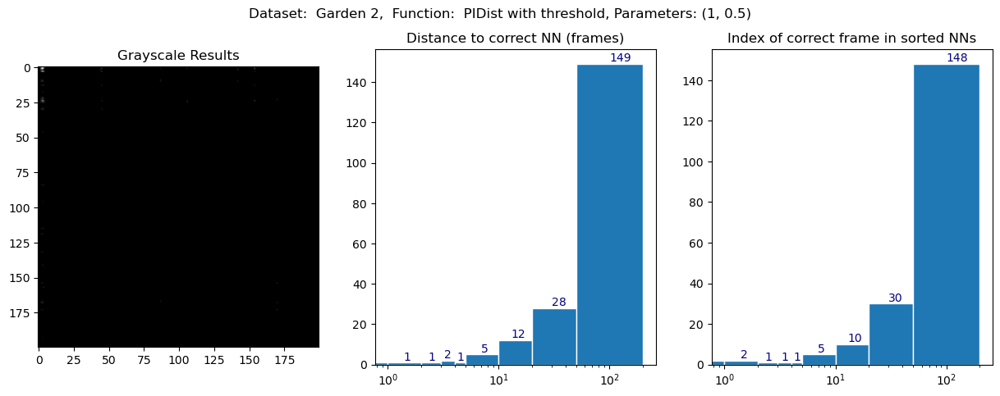

In [53]:
r, rdh, rr = nnt.run_and_evaluate_func_on_data(nnt.piDist_threshold_sequential, DS_garden_2, Q_garden_2, "Garden 2", "PIDist with threshold", True, 1, 0.5)

<h4>Nordland</h4>

Duration PIDist with threshold: 765.4919448330766 seconds
Median Distance to GT-NN: 41.0
Average Distance to GT-NN: 151.739
Median Rank of GT-NN: 6.0
Average Rank of GT-NN: 72.932
449 out of 1000 within top 5 NNs


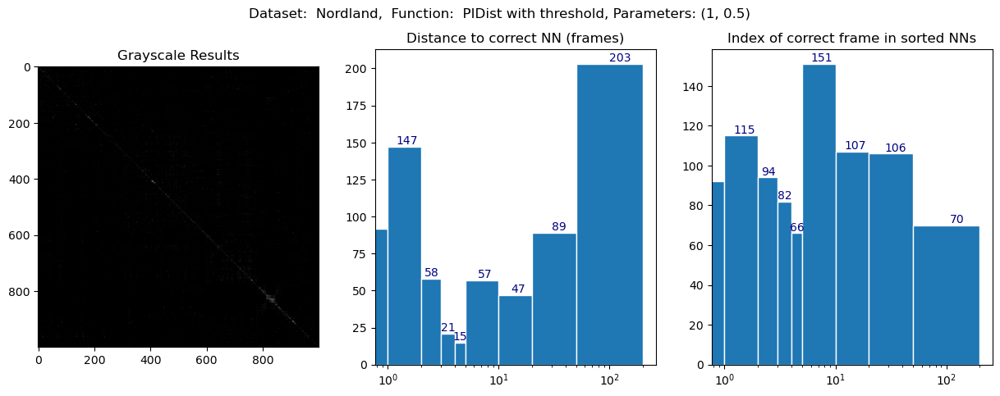

In [54]:
r, rdh, rr = nnt.run_and_evaluate_func_on_data(nnt.piDist_threshold_sequential, nl_spring_seer, nl_winter_seer, "Nordland", "PIDist with threshold", True, 1, 0.5)

<h3>p = 2, t = 0,5</h3>

<h4>Garden BZ</h4>

Duration PIDist with threshold: 7.26409979199525 seconds
Median Distance to GT-NN: 3.0
Average Distance to GT-NN: 13.035
Median Rank of GT-NN: 7.0
Average Rank of GT-NN: 26.505
82 out of 200 within top 5 NNs


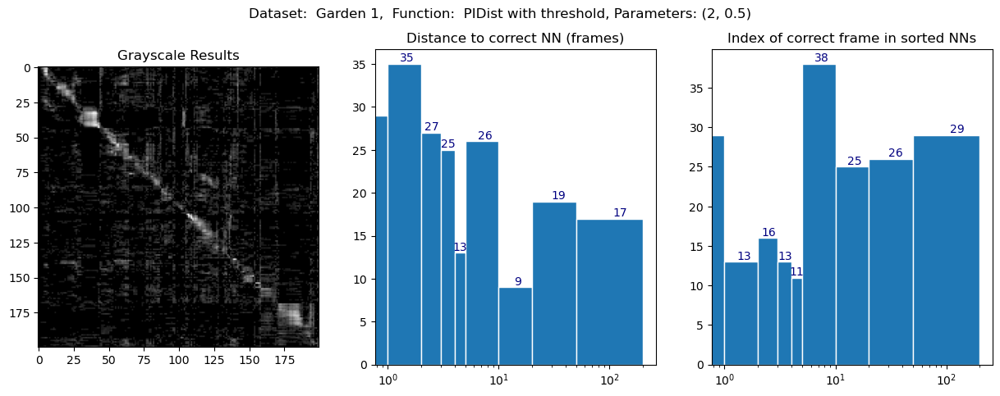

In [55]:
r, rdh, rr = nnt.run_and_evaluate_func_on_data(nnt.piDist_threshold_sequential, DS_garden_1, Q_garden_1, "Garden 1", "PIDist with threshold", True, 2, 0.5)

<h4>Garden PN</h4>

Duration PIDist with threshold: 8.637403958011419 seconds
Median Distance to GT-NN: 97.5
Average Distance to GT-NN: 98.195
Median Rank of GT-NN: 99.5
Average Rank of GT-NN: 98.795
7 out of 200 within top 5 NNs


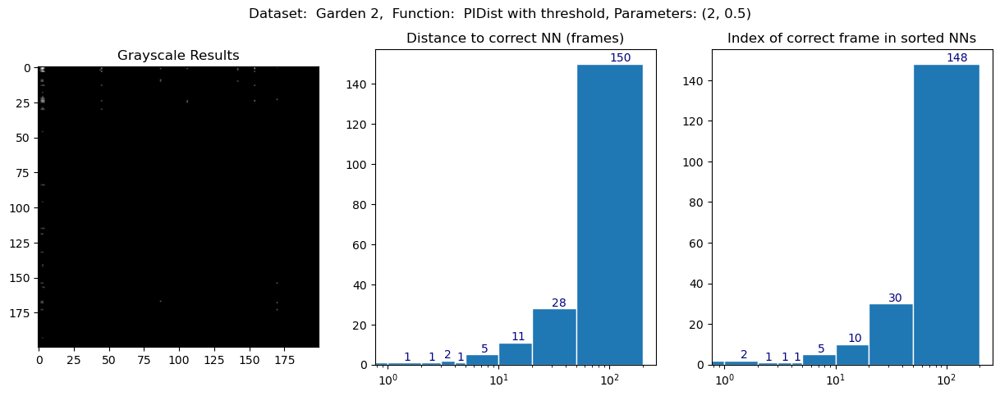

In [56]:
r, rdh, rr = nnt.run_and_evaluate_func_on_data(nnt.piDist_threshold_sequential, DS_garden_2, Q_garden_2, "Garden 2", "PIDist with threshold", True, 2, 0.5)

<h4>Nordland</h4>

Duration PIDist with threshold: 768.3092464170186 seconds
Median Distance to GT-NN: 37.5
Average Distance to GT-NN: 149.807
Median Rank of GT-NN: 6.0
Average Rank of GT-NN: 72.882
450 out of 1000 within top 5 NNs


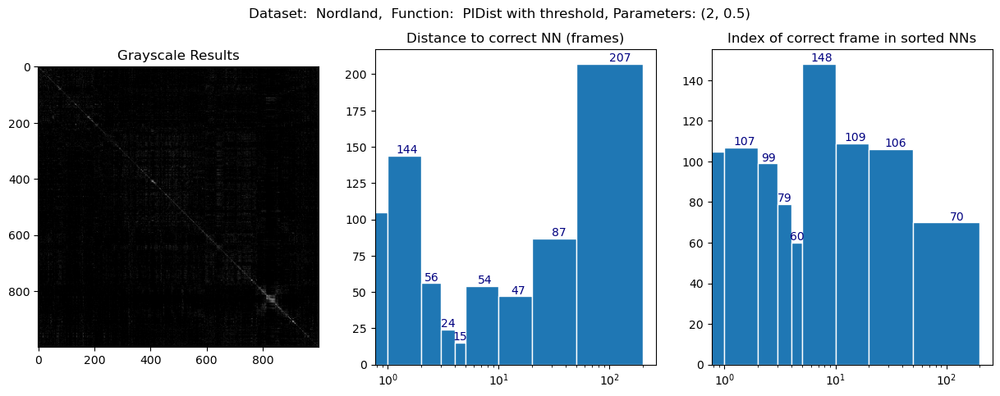

In [57]:
r, rdh, rr = nnt.run_and_evaluate_func_on_data(nnt.piDist_threshold_sequential, nl_spring_seer, nl_winter_seer, "Nordland", "PIDist with threshold", True, 2, 0.5)

<h2>SRP-LSH</h2>

Duration SRP_LSH: 101.98453704197891 seconds
Median Distance to GT-NN: 9.0
Average Distance to GT-NN: 32.415
Median Rank of GT-NN: 18.0
Average Rank of GT-NN: 43.53
55 out of 200 within top 5 NNs


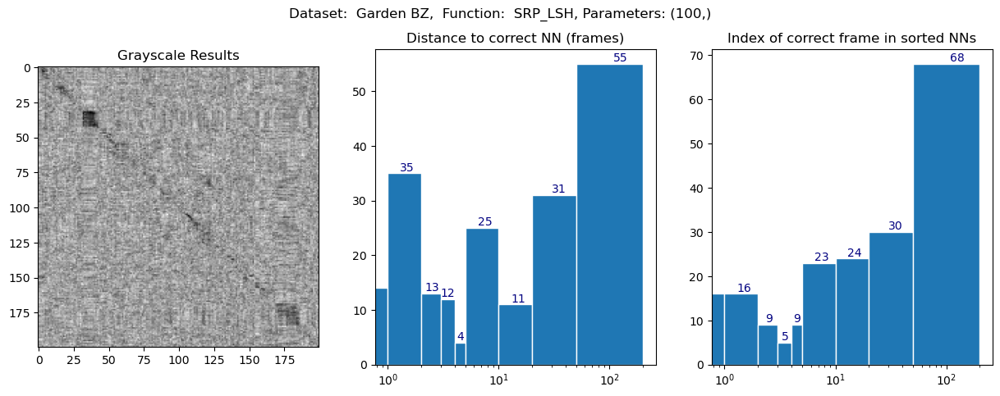

In [58]:
srp21, srp22, srp23 = nnt.run_and_evaluate_func_on_data(nnt.srp_lsh_sequential, DS_garden_1, Q_garden_1, "Garden BZ", "SRP_LSH", False, 100)

Duration SRP_LSH: 127.37002399994526 seconds
Median Distance to GT-NN: 18.5
Average Distance to GT-NN: 39.1
Median Rank of GT-NN: 31.5
Average Rank of GT-NN: 48.78
51 out of 200 within top 5 NNs


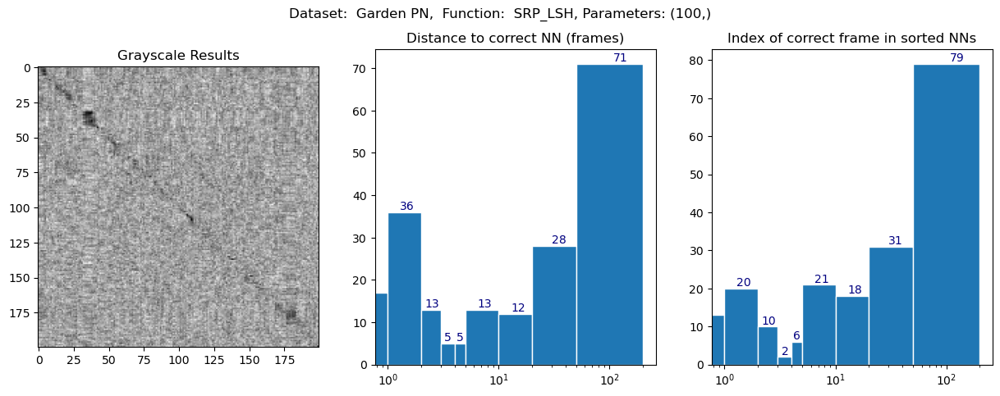

In [59]:
srp21, srp22, srp23 = nnt.run_and_evaluate_func_on_data(nnt.srp_lsh_sequential, DS_garden_2, Q_garden_2, "Garden PN", "SRP_LSH", False, 100)

Duration SRP_LSH: 113.74837645806838 seconds
Median Distance to GT-NN: 3.0
Average Distance to GT-NN: 19.435
Median Rank of GT-NN: 6.0
Average Rank of GT-NN: 26.63
91 out of 200 within top 5 NNs


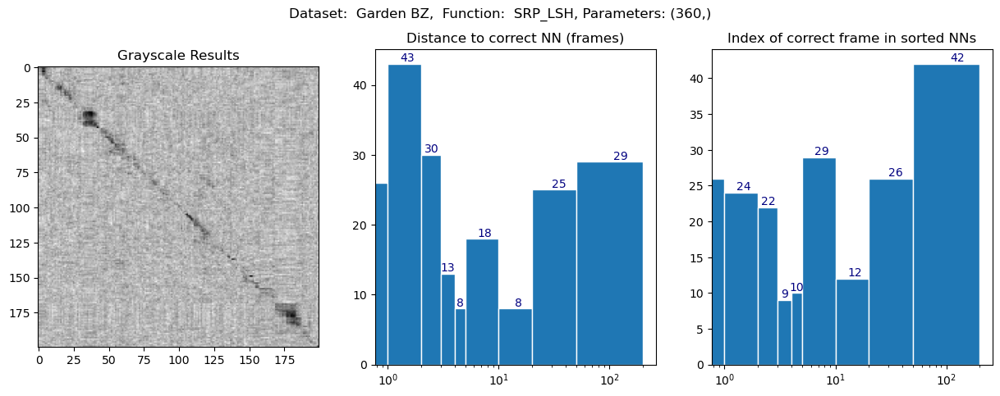

In [60]:
srp21, srp22, srp23 = nnt.run_and_evaluate_func_on_data(nnt.srp_lsh_sequential, DS_garden_1, Q_garden_1, "Garden BZ", "SRP_LSH", False, 360)

Duration SRP_LSH: 149.2142964580562 seconds
Median Distance to GT-NN: 2.0
Average Distance to GT-NN: 14.72
Median Rank of GT-NN: 5.0
Average Rank of GT-NN: 32.865
92 out of 200 within top 5 NNs


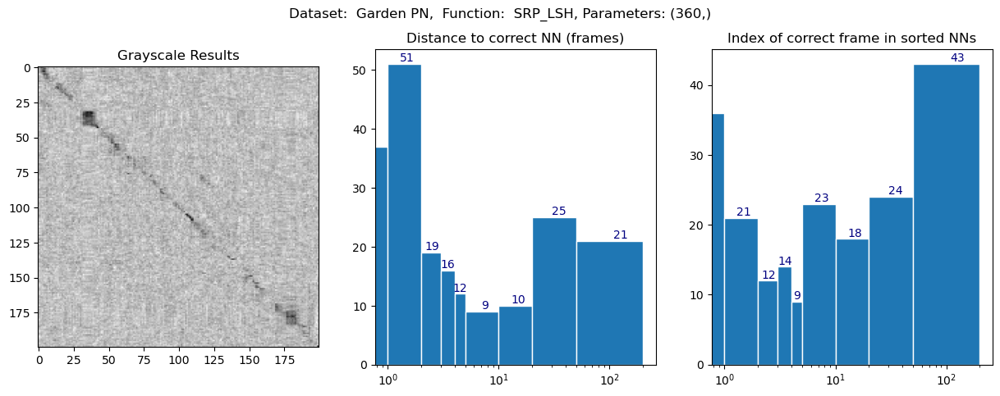

In [61]:
srp21, srp22, srp23 = nnt.run_and_evaluate_func_on_data(nnt.srp_lsh_sequential, DS_garden_2, Q_garden_2, "Garden PN", "SRP_LSH", False, 360)

Duration SRP_LSH: 245.67199091694783 seconds
Median Distance to GT-NN: 2.0
Average Distance to GT-NN: 12.56
Median Rank of GT-NN: 4.0
Average Rank of GT-NN: 21.62
103 out of 200 within top 5 NNs


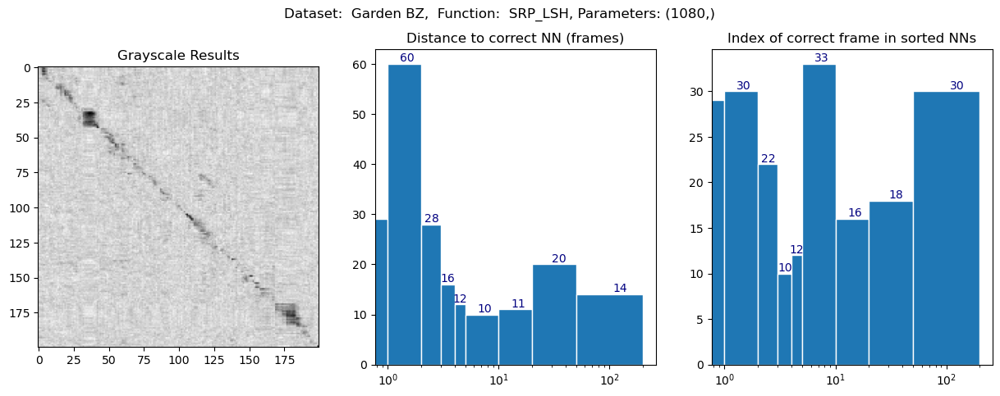

In [62]:
srp21, srp22, srp23 = nnt.run_and_evaluate_func_on_data(nnt.srp_lsh_sequential, DS_garden_1, Q_garden_1, "Garden BZ", "SRP_LSH", False, 1080)

Duration SRP_LSH: 257.957111124997 seconds
Median Distance to GT-NN: 2.0
Average Distance to GT-NN: 11.11
Median Rank of GT-NN: 4.0
Average Rank of GT-NN: 24.305
111 out of 200 within top 5 NNs


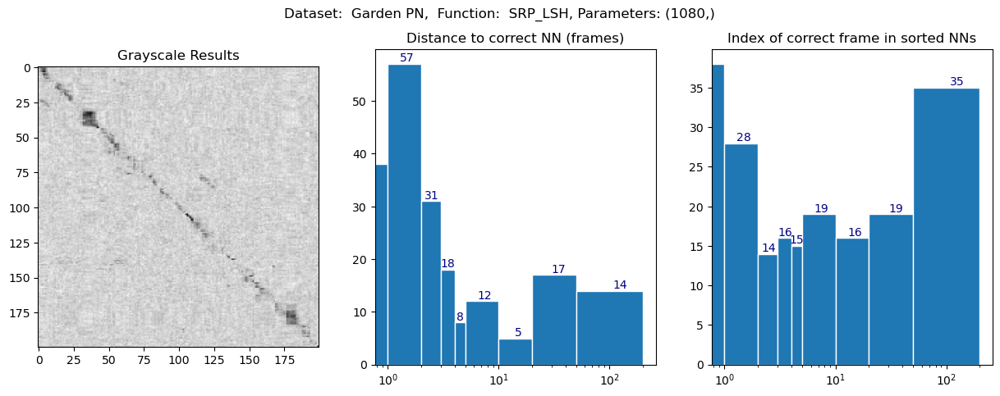

In [63]:
srp21, srp22, srp23 = nnt.run_and_evaluate_func_on_data(nnt.srp_lsh_sequential, DS_garden_2, Q_garden_2, "Garden PN", "SRP_LSH", False, 1080)

Duration SRP_LSH: 234.43580137507524 seconds
Median Distance to GT-NN: 2.0
Average Distance to GT-NN: 12.395
Median Rank of GT-NN: 3.5
Average Rank of GT-NN: 18.945
112 out of 200 within top 5 NNs


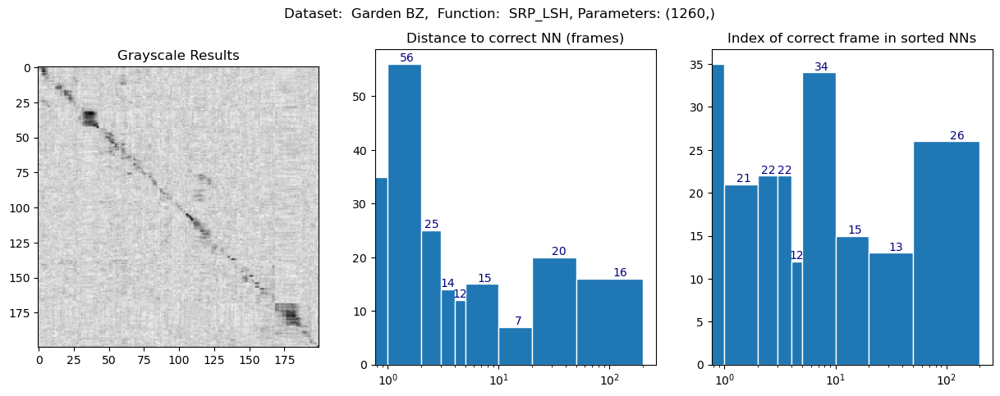

In [64]:
srp21, srp22, srp23 = nnt.run_and_evaluate_func_on_data(nnt.srp_lsh_sequential, DS_garden_1, Q_garden_1, "Garden BZ", "SRP_LSH", False, 1260)

Duration SRP_LSH: 261.2426435420057 seconds
Median Distance to GT-NN: 2.0
Average Distance to GT-NN: 9.715
Median Rank of GT-NN: 3.0
Average Rank of GT-NN: 24.37
111 out of 200 within top 5 NNs


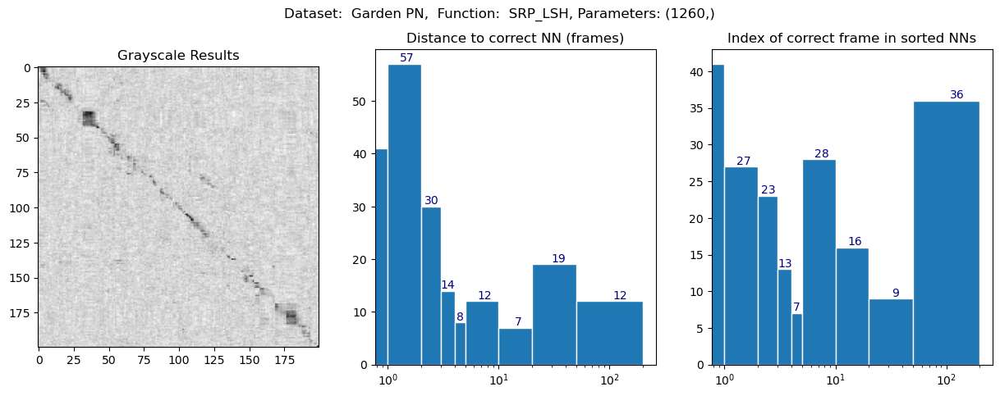

In [65]:
srp21, srp22, srp23 = nnt.run_and_evaluate_func_on_data(nnt.srp_lsh_sequential, DS_garden_2, Q_garden_2, "Garden PN", "SRP_LSH", False, 1260)

Duration SRP_LSH: 390.2207617920358 seconds
Median Distance to GT-NN: 2.0
Average Distance to GT-NN: 11.245
Median Rank of GT-NN: 3.0
Average Rank of GT-NN: 15.07
117 out of 200 within top 5 NNs


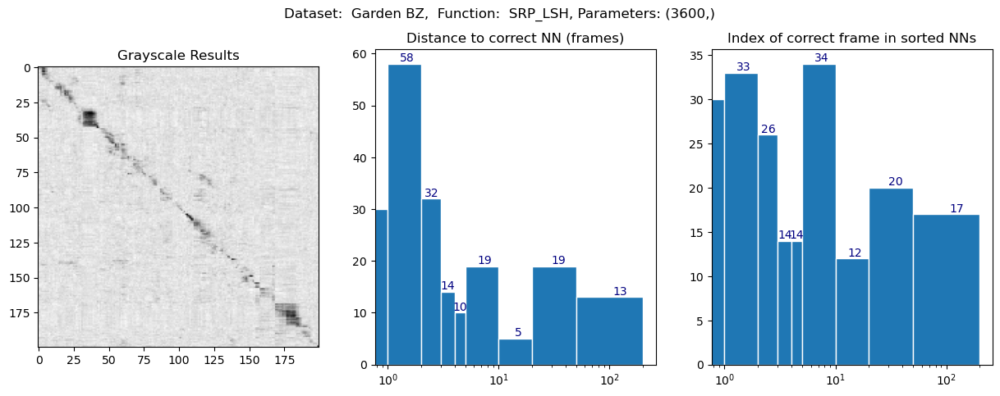

In [66]:
srp21, srp22, srp23 = nnt.run_and_evaluate_func_on_data(nnt.srp_lsh_sequential, DS_garden_1, Q_garden_1, "Garden BZ", "SRP_LSH", False, 3600)

Duration SRP_LSH: 425.8872827499872 seconds
Median Distance to GT-NN: 2.0
Average Distance to GT-NN: 10.2
Median Rank of GT-NN: 3.0
Average Rank of GT-NN: 22.57
113 out of 200 within top 5 NNs


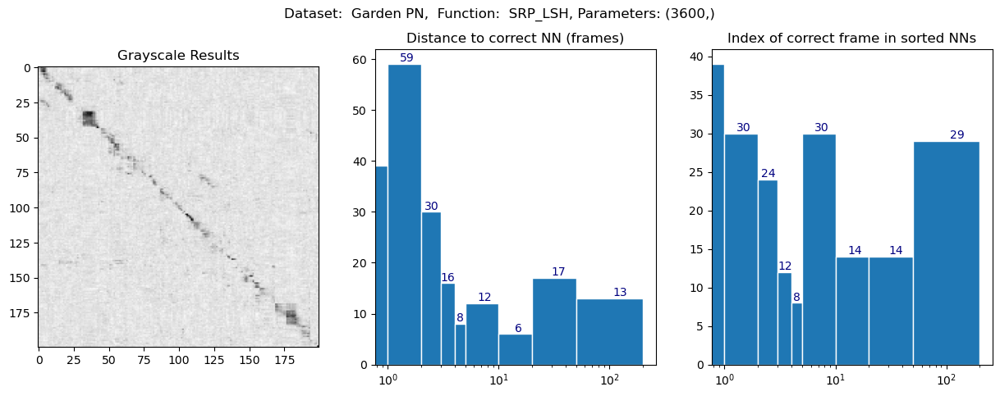

In [67]:
srp21, srp22, srp23 = nnt.run_and_evaluate_func_on_data(nnt.srp_lsh_sequential, DS_garden_2, Q_garden_2, "Garden PN", "SRP_LSH", False, 3600)

Duration SRP_LSH: 447.14850875001866 seconds
Median Distance to GT-NN: 2.0
Average Distance to GT-NN: 11.185
Median Rank of GT-NN: 3.0
Average Rank of GT-NN: 16.57
118 out of 200 within top 5 NNs


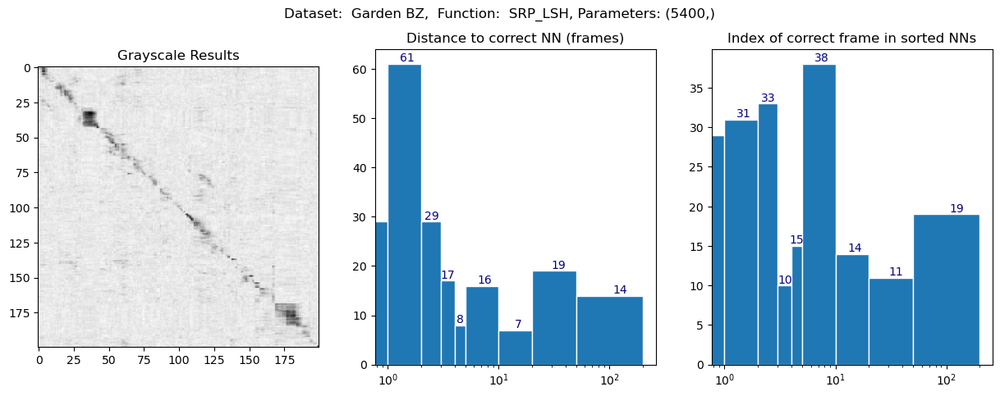

In [68]:
srp21, srp22, srp23 = nnt.run_and_evaluate_func_on_data(nnt.srp_lsh_sequential, DS_garden_1, Q_garden_1, "Garden BZ", "SRP_LSH", False, 5400)

Duration SRP_LSH: 522.022203792003 seconds
Median Distance to GT-NN: 1.5
Average Distance to GT-NN: 8.205
Median Rank of GT-NN: 3.0
Average Rank of GT-NN: 16.405
115 out of 200 within top 5 NNs


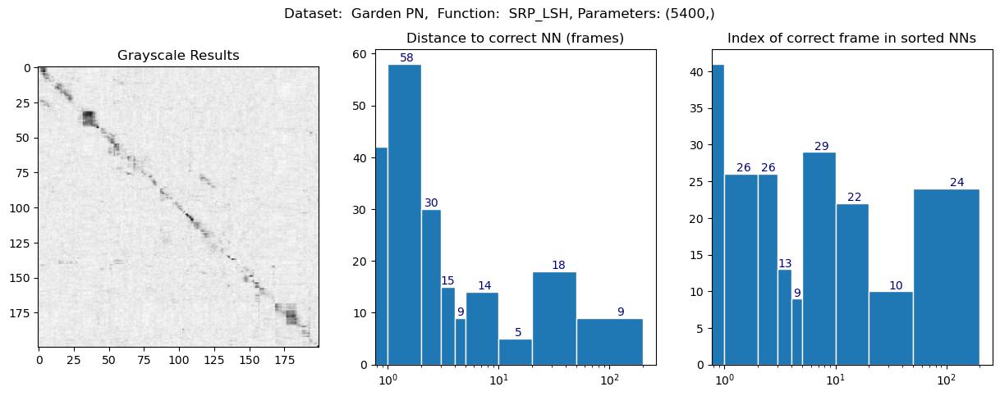

In [69]:
srp21, srp22, srp23 = nnt.run_and_evaluate_func_on_data(nnt.srp_lsh_sequential, DS_garden_2, Q_garden_2, "Garden PN", "SRP_LSH", False, 5400)

Duration SRP_LSH: 59158.212880583946 seconds
Median Distance to GT-NN: 0.0
Average Distance to GT-NN: 89.461
Median Rank of GT-NN: 0.0
Average Rank of GT-NN: 41.91
767 out of 1000 within top 5 NNs


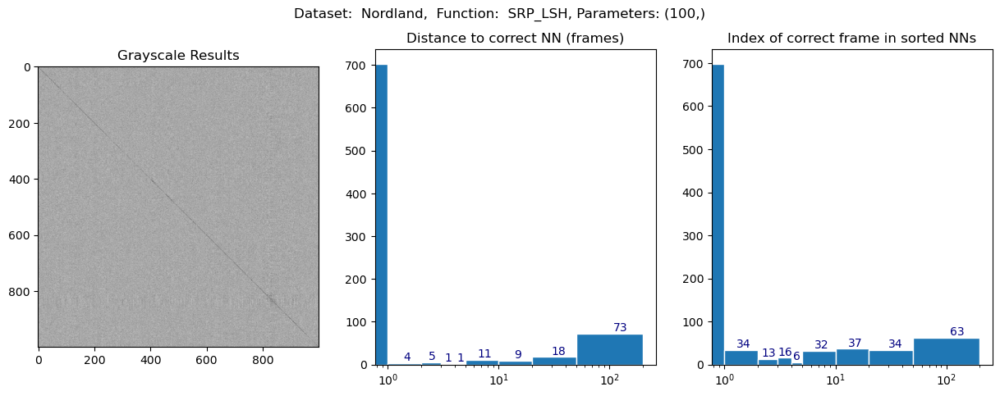

In [70]:
srp21, srp22, srp23 = nnt.run_and_evaluate_func_on_data(nnt.srp_lsh_sequential, nl_spring_seer, nl_winter_seer, "Nordland", "SRP_LSH", False, 100)

<h1>Outlier Inspection</h1>

Duration Cosine Sim: 0.00186804193072021 seconds
Median Distance to GT-NN: 1.0
Average Distance to GT-NN: 5.752577319587629
Median Rank of GT-NN: 2.0
Average Rank of GT-NN: 9.38659793814433
124 out of 194 within top 5 NNs


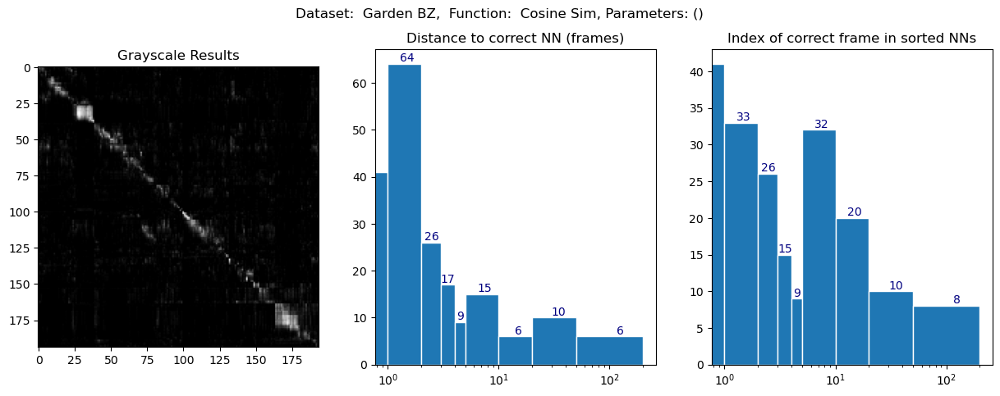

In [71]:
r11, r12, r13 = nnt.run_and_evaluate_func_on_data(skmet.pairwise.cosine_similarity, DS_garden_1[5:199,:], Q_garden_1[5:199,:], "Garden BZ", "Cosine Sim", True)

Duration Cosine Sim: 0.001835125032812357 seconds
Median Distance to GT-NN: 1.0
Average Distance to GT-NN: 10.664948453608247
Median Rank of GT-NN: 2.0
Average Rank of GT-NN: 10.891752577319588
126 out of 194 within top 5 NNs


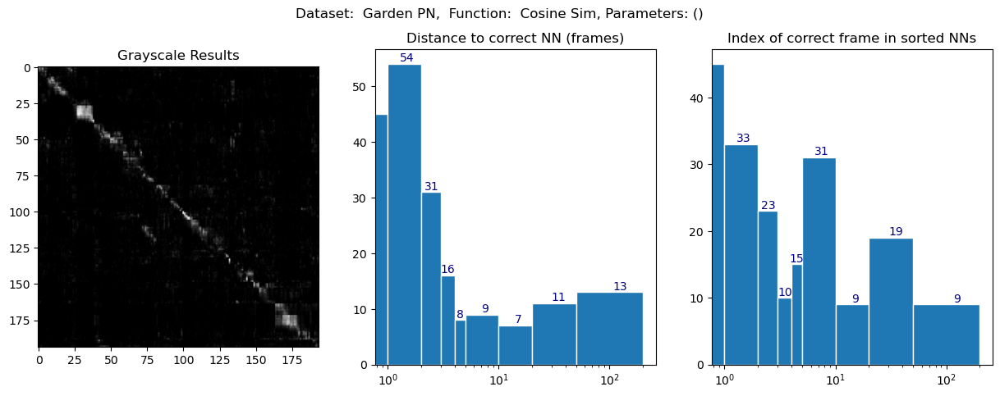

In [72]:
r21, r22, r23 = nnt.run_and_evaluate_func_on_data(skmet.pairwise.cosine_similarity, DS_garden_2[5:199,:], Q_garden_2[5:199,:], "Garden PN", "Cosine Sim", True)

Duration Cosine Sim: 0.006172249908559024 seconds
Median Distance to GT-NN: 0.0
Average Distance to GT-NN: 9.176
Median Rank of GT-NN: 0.0
Average Rank of GT-NN: 4.731
978 out of 1000 within top 5 NNs


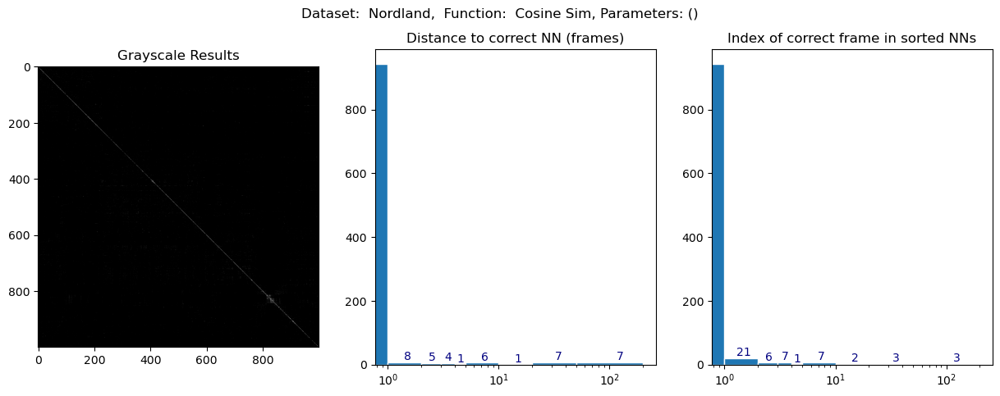

In [73]:
r31, r32, r33 = nnt.run_and_evaluate_func_on_data(skmet.pairwise.cosine_similarity, nl_spring_seer, nl_winter_seer, "Nordland", "Cosine Sim", True)

Duration Fractional_Dist: 2.9149938330519944 seconds
Median Distance to GT-NN: 2.0
Average Distance to GT-NN: 9.350515463917526
Median Rank of GT-NN: 3.0
Average Rank of GT-NN: 12.541237113402062
115 out of 194 within top 5 NNs


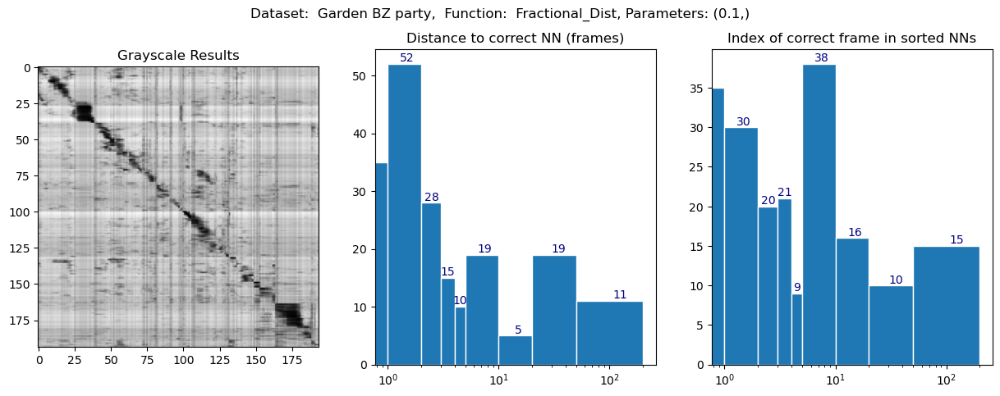

In [74]:
r41, r42, r43 = nnt.run_and_evaluate_func_on_data(nnt.sequential_lk_dist, DS_garden_1[5:199,:], Q_garden_1[5:199,:], "Garden BZ party", "Fractional_Dist", False, 0.1)

Duration Fractional_Dist: 2.627937125042081 seconds
Median Distance to GT-NN: 2.0
Average Distance to GT-NN: 9.097938144329897
Median Rank of GT-NN: 3.0
Average Rank of GT-NN: 15.20103092783505
114 out of 194 within top 5 NNs


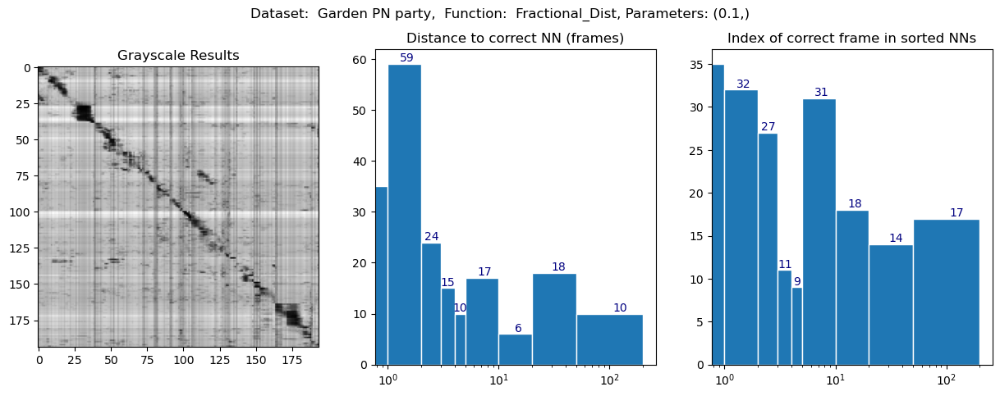

In [75]:
r51, r52, r53 = nnt.run_and_evaluate_func_on_data(nnt.sequential_lk_dist, DS_garden_2[5:199,:], Q_garden_2[5:199,:], "Garden PN party", "Fractional_Dist", False, 0.1)

Duration Fractional_Dist: 1436.8046852919506 seconds
Median Distance to GT-NN: 0.0
Average Distance to GT-NN: 26.622
Median Rank of GT-NN: 0.0
Average Rank of GT-NN: 7.347
947 out of 1000 within top 5 NNs


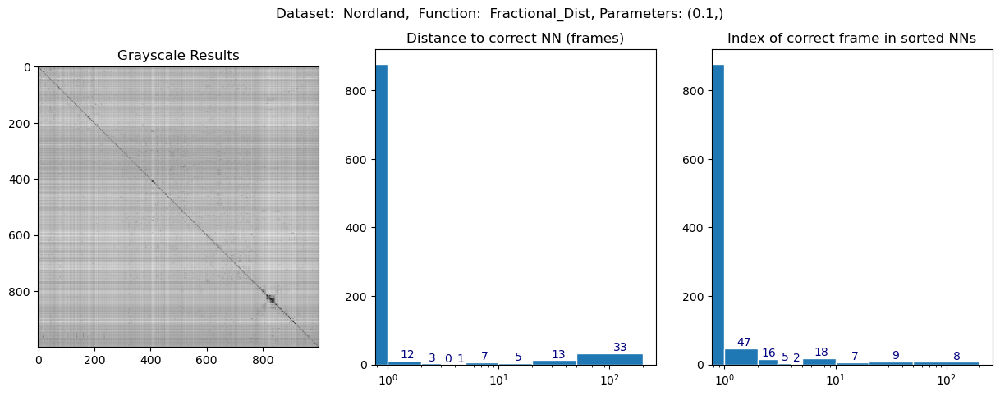

In [76]:
r61, r62, r63 = nnt.run_and_evaluate_func_on_data(nnt.sequential_lk_dist, nl_spring_seer, nl_winter_seer, "Nordland", "Fractional_Dist", False, 0.1)

Duration Count Common Dimensions: 2.9953342500375584 seconds
Median Distance to GT-NN: 2.0
Average Distance to GT-NN: 10.664948453608247
Median Rank of GT-NN: 3.0
Average Rank of GT-NN: 11.556701030927835
119 out of 194 within top 5 NNs


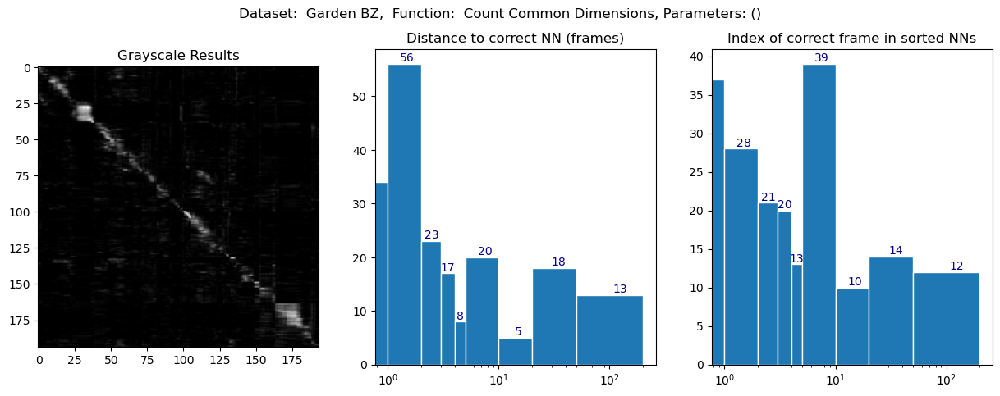

In [77]:
r71, r72, r73 = nnt.run_and_evaluate_func_on_data(nnt.compute_matching_dimensions_sequential, DS_garden_1[5:199,:], Q_garden_1[5:199,:], "Garden BZ", "Count Common Dimensions", True)

Duration Count Common Dimensions: 3.594936458976008 seconds
Median Distance to GT-NN: 1.0
Average Distance to GT-NN: 8.396907216494846
Median Rank of GT-NN: 3.0
Average Rank of GT-NN: 13.350515463917526
120 out of 194 within top 5 NNs


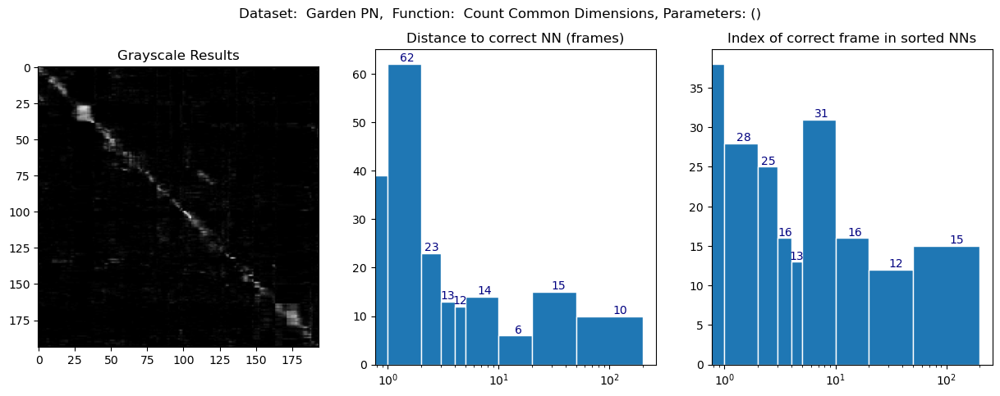

In [78]:
r81, r82, r83 = nnt.run_and_evaluate_func_on_data(nnt.compute_matching_dimensions_sequential, DS_garden_2[5:199,:], Q_garden_2[5:199,:], "Garden PN", "Count Common Dimensions", True)

Duration Count Common Dimensions: 1224.672212916892 seconds
Median Distance to GT-NN: 0.0
Average Distance to GT-NN: 28.608
Median Rank of GT-NN: 0.0
Average Rank of GT-NN: 6.556
949 out of 1000 within top 5 NNs


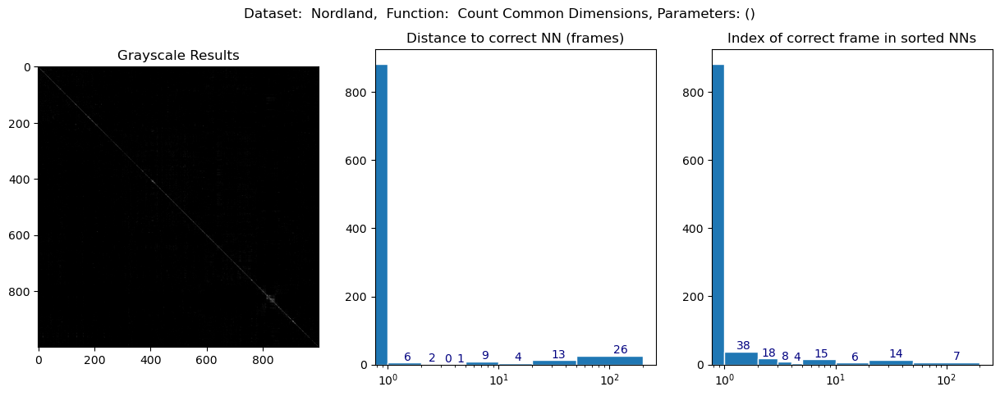

In [79]:
r91, r92, r93 = nnt.run_and_evaluate_func_on_data(nnt.compute_matching_dimensions_sequential, nl_spring_seer, nl_winter_seer, "Nordland", "Count Common Dimensions", True)

In [80]:
garden1_mat1 = np.intersect1d(np.where(r12 > 15), np.intersect1d(np.where(r42 > 15), np.where(r72 > 15))) #distance

In [81]:
garden2_mat1 = np.intersect1d(np.where(r22 > 15), np.intersect1d(np.where(r52 > 15), np.where(r82 > 15))) #distance

In [82]:
nordland_mat1 = np.intersect1d(np.where(r32 > 15), np.intersect1d(np.where(r62 > 15), np.where(r92 > 15))) #distance

In [83]:
garden1_mat2 = np.intersect1d(np.where(r13 > 5), np.intersect1d(np.where(r43 > 5), np.where(r73 > 5))) #rank

In [84]:
garden2_mat2 = np.intersect1d(np.where(r23 > 5), np.intersect1d(np.where(r53 > 5), np.where(r83 > 5))) #rank

In [85]:
nordland_mat2 = np.intersect1d(np.where(r33 > 5), np.intersect1d(np.where(r63 > 5), np.where(r93 > 5))) #rank

In [86]:
np.intersect1d(garden2_mat2, garden1_mat2)

array([  6,  23,  24,  25,  43,  72,  80,  81,  90,  91, 117, 118, 119,
       120, 128, 133, 134, 135, 136, 138, 139, 142, 158, 160, 174, 180,
       181, 182, 189, 193])

In [87]:
print("Garden 1, Mat 1: ",garden1_mat1.size)
print("Garden 1, Mat 2: ",garden1_mat2.size)

print("Garden 2, Mat 1: ",garden2_mat1.size)
print("Garden 2, Mat 2: ",garden2_mat2.size)

print("NL, Mat 1: ",nordland_mat1.size)
print("NL, Mat 2: ",nordland_mat2.size)

Garden 1, Mat 1:  8
Garden 1, Mat 2:  44
Garden 2, Mat 1:  8
Garden 2, Mat 2:  43
NL, Mat 1:  31
NL, Mat 2:  19


In [88]:
DS_Garden_2_short = DS_garden_2[5:199,:]
Q_garden_2_short = Q_garden_2[5:199,:]
DS_Garden_1_short = DS_garden_1[5:199,:]
Q_garden_1_short = Q_garden_1[5:199,:]

In [89]:
nordland_mat2[0]

7

In [90]:
nl_spring_seer[[1,3],:]

<2x49389 sparse matrix of type '<class 'numpy.float64'>'
	with 200 stored elements in Compressed Sparse Column format>

In [91]:
d_g_1_problems_1 = DS_Garden_1_short[garden1_mat1,:]
q_g_1_problems_1 = Q_garden_1_short[garden1_mat1,:]
d_g_1_problems_2 = DS_Garden_1_short[garden1_mat2,:]
q_g_1_problems_2 = Q_garden_1_short[garden1_mat2,:]

d_g_2_problems_1 = DS_Garden_2_short[garden2_mat1,:]
q_g_2_problems_1 = Q_garden_2_short[garden2_mat1,:]
d_g_2_problems_2 = DS_Garden_2_short[garden2_mat2,:]
q_g_2_problems_2 = Q_garden_2_short[garden2_mat2,:]

nl_winter_problems_1 = nl_winter_seer[nordland_mat1,:]
nl_spring_problems_1 = nl_spring_seer[nordland_mat1,:]
nl_winter_problems_2 = nl_winter_seer[nordland_mat2,:]
nl_spring_problems_2 = nl_spring_seer[nordland_mat2,:]

In [92]:
d_g_1_problems_1[0].nonzero()[1]

array([858, 878, 882, 886, 888, 892, 894, 895, 896, 898, 900, 904, 906,
       908, 909, 910, 911, 912, 913, 914, 915, 916, 917, 918, 919, 920,
       922, 924, 925, 926, 927, 928, 929, 930, 931, 932, 933, 934, 935,
       936, 937, 938, 939, 940, 941, 942, 943, 944, 945, 946, 947, 948,
       949, 950, 951, 952, 953, 954, 955, 956, 957, 958, 959, 960, 961,
       962, 963, 964, 965, 966, 967, 968, 969, 970, 971, 972, 973, 974,
       975, 976, 977, 978, 979, 980, 981, 982, 983, 984, 985, 986, 987,
       988, 989, 990, 991, 992, 993, 994, 995, 996], dtype=int32)

In [93]:
q_g_1_problems_1[0].nonzero()[1]

array([  51,   64,   76,   77,   78,   81,   86,   88,  105,  127,  150,
        154,  160,  161,  164,  165,  172,  174,  182,  193,  195,  210,
        216,  219,  248,  253,  336,  343,  612,  870,  888,  912,  916,
        918,  928,  936,  958,  975, 1018, 1759, 1949, 1990, 2157, 2190,
       2197, 2249, 2351, 2464, 2500, 2544, 2546, 2553, 2564, 2592, 2666,
       2672, 2732, 2972, 3145, 3154, 3437, 3481, 4042, 4048, 4082, 4565,
       4631, 4647, 4649, 4665, 4669, 4679, 4681, 4687, 4696, 4701, 4711,
       4725, 4761, 4937, 4949, 4951, 4969, 5007, 5008, 5016, 5018, 5029,
       5038, 5087, 5134, 5136, 5140, 5159, 5778, 5856, 5861, 5867, 5883,
       5889], dtype=int32)

In [94]:
#%matplotlib qt
x1 = garden1_mat1
y_arrays = d_g_1_problems_1

# Iterate over x1 and corresponding y arrays
for i, x_val in enumerate(x1):
    for i in range(y_arrays.shape[0]):
        y_array1 = d_g_1_problems_1[i].nonzero()[1]
        y_array2 = q_g_1_problems_1[i].nonzero()[1]
        # Plot a scatter plot for each x-value and corresponding y-array values
        plt.scatter([x_val] * len(y_array1), y_array1, alpha=1, color = 'g', s=1)
        plt.scatter([x_val + 0.1] * len(y_array2), y_array2, alpha=1, color = 'b', s=1)

# Set labels
plt.xlabel("x1 Values")
plt.ylabel("y Values")

# Optional: Add grid and legend
plt.grid(True)
plt.figure(figsize=(5, 40))

# Display the plot
plt.show()

In [95]:
x1

array([ 22,  23,  72,  73,  80,  81, 118, 139])